In [1]:
# Librerías estándar y manipulación de archivos
import os
import joblib

# Manipulación de datos y operaciones básicas
import numpy as np

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns

# Modelos de Machine Learning
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# Selección y validación de modelos
from sklearn.model_selection import GridSearchCV, StratifiedKFold,  cross_val_score, KFold

# Métricas de evaluación
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, f1_score, roc_curve, auc

# Configuraciones adicionales
import warnings

#Se importan las librerias necesarias para el uso de pytorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from pytorch_tabnet.tab_model import TabNetClassifier


# Se ignoran los warnings en el notebook
warnings.filterwarnings('ignore')

# Se define el dispositivo a utilizar
print(torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Número de GPU disponibles:", torch.cuda.device_count())
    print("Nombre de la GPU 0:", torch.cuda.get_device_name(0))
    print("Dispositivo actual:", torch.cuda.current_device())

# Se define el dispositivo a utilizar
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

2.3.1+cu121
CUDA disponible: True
Número de GPU disponibles: 1
Nombre de la GPU 0: NVIDIA GeForce RTX 3090
Dispositivo actual: 0


In [2]:
def evaluar_modelo_sklearn(model, X_train, y_train, X_test, y_test, dataset_name, model_name):
    # Evaluación con datos de entrenamiento
    y_pred_train = model.predict(X_train)
    y_pred_train_prob = model.predict_proba(X_train)[:, 1]

    # Cálculo de métricas para datos de entrenamiento
    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy_train}")
    print(f"Precision (Datos de Train): {precision_train}")
    print(f"Recall (Datos de Train): {recall_train}")
    print(f"F1 Score (Datos de Train): {f1_train}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train {model_name} para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_train)

    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train_prob)
    roc_auc_train = auc(fpr_train, tpr_train)
    axes[1].plot(fpr_train, tpr_train, color='darkorange', lw=2, label=f'AUC = {roc_auc_train:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model.predict(X_test)
    y_pred_test_prob = model.predict_proba(X_test)[:, 1]

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test {model_name} para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_test_prob)
    roc_auc_test = auc(fpr_test, tpr_test)
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [3]:
def execute_model_logistic_regression(X, y, X_test, y_test, dataset_name):
    model_dir = 'models'
    model_name = 'Regresión Logística'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_logistic_regression_{dataset_name}.joblib')
    params_log_filename = os.path.join(model_dir, f'modelo_logistic_regression_{dataset_name}_params.txt')

    if os.path.exists(model_filename):
        model = joblib.load(model_filename)
        print("Modelo cargado exitosamente.")
        if os.path.exists(params_log_filename):
            with open(params_log_filename, 'r') as f:
                best_params = f.read()
                print(f"Mejores hiperparámetros cargados: {best_params}")
        else:
            print("No se encontraron hiperparámetros guardados.")
        evaluar_modelo_sklearn(model, X, y, X_test, y_test, dataset_name, model_name)
        return

    # Se define el rango de hiperparámetros para la búsqueda en cuadrícula
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        'max_iter': [100, 200, 300, 500, 1000]
    }

    # Configura la búsqueda en cuadrícula
    grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    best_score = 0
    best_model = None
    best_params = None

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        grid_search.fit(X_train, y_train)
        candidate_model = grid_search.best_estimator_
        val_score = accuracy_score(y_val, candidate_model.predict(X_val))

        if val_score > best_score:
            best_score = val_score
            best_model = candidate_model
            best_params = grid_search.best_params_

    print(f"Mejores hiperparámetros: {best_params}")
    print(f"Mejor puntaje de validación: {best_score}")

    # Guardar los mejores hiperparámetros en un archivo de registro
    with open(params_log_filename, 'w') as f:
        f.write(str(best_params))

    # Guarda el mejor modelo
    joblib.dump(best_model, model_filename)
    print(f"Modelo guardado en {model_filename}")

    # Evalúa el mejor modelo
    evaluar_modelo_sklearn(best_model, X, y, X_test, y_test, dataset_name, model_name)

# Suponiendo que evaluar_modelo_sklearn está definida en otro lugar y no se puede editar.


In [4]:
def execute_model_decision_tree(X, y, X_test, y_test, dataset_name):
    model_dir = 'models'
    model_name = 'Árbol de Decisión'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_decision_tree_{dataset_name}.joblib')
    params_log_filename = os.path.join(model_dir, f'modelo_decision_tree_{dataset_name}_params.txt')

    if os.path.exists(model_filename):
        model = joblib.load(model_filename)
        print("Modelo cargado exitosamente.")
        if os.path.exists(params_log_filename):
            with open(params_log_filename, 'r') as f:
                best_params = f.read()
                print(f"Mejores hiperparámetros cargados: {best_params}")
        else:
            print("No se encontraron hiperparámetros guardados.")
        evaluar_modelo_sklearn(model, X, y, X_test, y_test, dataset_name, model_name)
        return

    # Se define el rango de hiperparámetros para la búsqueda en cuadrícula
    param_grid = {
        'criterion': ['gini', 'entropy'],
        'max_depth': [10, 15, 20],
        'min_samples_split': [2, 3, 5],
        'min_samples_leaf': [2, 3, 4]
    }

    # Configura la búsqueda en cuadrícula
    grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    best_score = 0
    best_model = None
    best_params = None

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        grid_search.fit(X_train, y_train)
        candidate_model = grid_search.best_estimator_
        val_score = accuracy_score(y_val, candidate_model.predict(X_val))

        if val_score > best_score:
            best_score = val_score
            best_model = candidate_model
            best_params = grid_search.best_params_

    print(f"Mejores hiperparámetros: {best_params}")
    print(f"Mejor puntaje de validación: {best_score}")

    # Guardar los mejores hiperparámetros en un archivo de registro
    with open(params_log_filename, 'w') as f:
        f.write(str(best_params))

    # Guarda el mejor modelo
    joblib.dump(best_model, model_filename)
    print(f"Modelo guardado en {model_filename}")

    # Evalúa el mejor modelo
    evaluar_modelo_sklearn(best_model, X, y, X_test, y_test, dataset_name, model_name)

In [5]:
# Se define la funcion para graficar la perdida por epoca para red neuronal de pytorch
def graficar_progreso(losses, inicio_folds, dataset_name, grado=3):
    plt.figure(figsize=(20, 10))
    # Gráfico original
    plt.plot(range(1, len(losses) + 1), losses, marker='o', linestyle='-', color='blue', label='Pérdida Real')

     # Marcar y anotar el inicio de cada fold
    for i, inicio in enumerate(inicio_folds):
        plt.axvline(x=inicio, color='black', linestyle='--', lw=1)
        plt.text(inicio, max(losses)*0.95, f'Inicio Fold {i+1}', rotation=90, color='black', fontsize=12, fontweight='bold')

    # Ajustando la curva de tendencia
    z = np.polyfit(range(1, len(losses) + 1), losses, grado)  # Ajuste polinomial
    p = np.poly1d(z)  # Creación de un polinomio
    plt.plot(range(1, len(losses) + 1), p(range(1, len(losses) + 1)), "r--", label='Curva de Tendencia')  # Curva de tendencia en rojo

    # Configuración del gráfico
    plt.title(f'Pérdida por Época a través de los Folds, Dataset: {dataset_name}')
    plt.xlabel('Época Total')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.grid(True)
    plt.show()


In [6]:
def evaluar_modelo_pytorch(model, X_train_tensor, y_train, X_test_tensor, y_test, dataset_name):
    # Evaluación con datos de entrenamiento
    y_pred = model(X_train_tensor).detach().cpu().numpy()
    y_pred_bin = (y_pred > 0.5).astype(int)

    # Cálculo de métricas para datos de entrenamiento
    accuracy = accuracy_score(y_train, y_pred_bin)
    precision = precision_score(y_train, y_pred_bin)
    recall = recall_score(y_train, y_pred_bin)
    f1 = f1_score(y_train, y_pred_bin)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy}")
    print(f"Precision (Datos de Train): {precision}")
    print(f"Recall (Datos de Train): {recall}")
    print(f"F1 Score (Datos de Train): {f1}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train Red Neuronal para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix = confusion_matrix(y_train, y_pred_bin)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix)

    fpr, tpr, thresholds = roc_curve(y_train, y_pred)
    roc_auc = auc(fpr, tpr)
    axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model(X_test_tensor).detach().cpu().numpy()
    y_pred_test_bin = (y_pred_test > 0.5).astype(int)

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test_bin)
    precision_test = precision_score(y_test, y_pred_test_bin)
    recall_test = recall_score(y_test, y_pred_test_bin)
    f1_test = f1_score(y_test, y_pred_test_bin)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test Red Neuronal para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test_bin)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_test)
    roc_auc_test = auc(fpr_test, tpr_test)
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


In [7]:
def evaluar_modelo_tabnet(model, X_train, y_train, X_test, y_test, dataset_name):
    # Evaluación con datos de entrenamiento
    y_pred = model.predict_proba(X_train)[:, 1]
    y_pred_bin = (y_pred > 0.5).astype(int)

    # Cálculo de métricas para datos de entrenamiento
    accuracy = accuracy_score(y_train, y_pred_bin)
    precision = precision_score(y_train, y_pred_bin)
    recall = recall_score(y_train, y_pred_bin)
    f1 = f1_score(y_train, y_pred_bin)

    # Visualización de métricas y gráficos para datos de entrenamiento
    print('\033[1m' + '.' * len("Resultados datos de entrenamiento:") + '\n' + "Resultados datos de entrenamiento:" + '\033[0m')
    print(f"Accuracy (Datos de Train): {accuracy}")
    print(f"Precision (Datos de Train): {precision}")
    print(f"Recall (Datos de Train): {recall}")
    print(f"F1 Score (Datos de Train): {f1}")

    # Gráficos para datos de entrenamiento
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Train TabNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix = confusion_matrix(y_train, y_pred_bin)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Train)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix)

    fpr, tpr, thresholds = roc_curve(y_train, y_pred)
    roc_auc = auc(fpr, tpr)
    axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Train)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Evaluación con datos de prueba
    y_pred_test = model.predict_proba(X_test)[:, 1]
    y_pred_test_bin = (y_pred_test > 0.5).astype(int)

    # Cálculo de métricas para datos de prueba
    accuracy_test = accuracy_score(y_test, y_pred_test_bin)
    precision_test = precision_score(y_test, y_pred_test_bin)
    recall_test = recall_score(y_test, y_pred_test_bin)
    f1_test = f1_score(y_test, y_pred_test_bin)

    # Visualización de métricas y gráficos para datos de prueba
    print('\033[1m' + '.' * len("Resultados datos de test:") + '\n' + "Resultados datos de test:" + '\033[0m')
    print(f"Accuracy (Datos de Test): {accuracy_test}")
    print(f"Precision (Datos de Test): {precision_test}")
    print(f"Recall (Datos de Test): {recall_test}")
    print(f"F1 Score (Datos de Test): {f1_test}")

    # Gráficos para datos de prueba
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Resultados de Test TabNet para el Dataset: - {dataset_name}', fontsize=16, fontweight='bold', y=1.05)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test_bin)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Asiste', 'No-show'], yticklabels=['Asiste', 'No-show'])
    axes[0].set_title('Matriz de Confusión (Datos de Test)')
    axes[0].set_xlabel('Predicho')
    axes[0].set_ylabel('Real')
    print(conf_matrix_test)

    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_pred_test)
    roc_auc_test = auc(fpr_test, tpr_test)
    axes[1].plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'AUC = {roc_auc_test:.2f}')
    axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_title('Curva ROC (Datos de Test)')
    axes[1].set_xlabel('Tasa de Falsos Positivos')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos')
    axes[1].legend(loc="lower right")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [8]:
# Se define la función para ejecutar el modelo en PyTorch de NeuralNet
def execute_model_pytorch(X_train, y_train, X_test, y_test, device, dataset_name):
    class NeuralNet(nn.Module):
        def __init__(self, input_size):
            super(NeuralNet, self).__init__()
            self.layer1 = nn.Linear(input_size, 64)
            self.bn1 = nn.BatchNorm1d(64)
            self.relu1 = nn.ReLU()

            self.layer2 = nn.Linear(64, 32)
            self.bn2 = nn.BatchNorm1d(32)
            self.relu2 = nn.ReLU()
            self.dropout1 = nn.Dropout(0.5)

            self.output_layer = nn.Linear(32, 1)
            self.sigmoid = nn.Sigmoid()

        def forward(self, x):
            out = self.bn1(self.layer1(x))
            out = self.relu1(out)

            out = self.bn2(self.layer2(out))
            out = self.relu2(out)
            out = self.dropout1(out)

            out = self.output_layer(out)
            out = self.sigmoid(out)
            return out

    model = NeuralNet(X_train.shape[1]).to(device)

    model_dir = 'models'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_pytorch_{dataset_name}.pth')

    if os.path.exists(model_filename):
        model.load_state_dict(torch.load(model_filename))
        print("Modelo cargado exitosamente.")

        X_test_tensor = torch.tensor(X_test).float().to(device)
        X_train_fold_tensor = torch.tensor(X_train).float().to(device)
        y_train_fold = y_train
        evaluar_modelo_pytorch(model, X_train_fold_tensor, y_train_fold, X_test_tensor, y_test, dataset_name)
        return

    skfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    num_epochs = 100
    patience = 10  # Número de épocas a esperar antes de detener el entrenamiento si no hay mejora
    fold_results = []
    losses = []
    inicio_folds = [1]
    epoca_actual = 0

    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5) 
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

    best_global_val_loss = float('inf')
    best_model_state = None

    for fold, (train_index, test_index) in enumerate(skfolds.split(X_train, y_train)):
        print(f'Comenzando el fold {fold+1}')

        X_train_fold = X_train[train_index]
        y_train_fold = y_train[train_index]
        X_valid_fold = X_train[test_index]
        y_valid_fold = y_train[test_index]

        X_train_fold_tensor = torch.tensor(X_train_fold).float().to(device)
        y_train_fold_tensor = torch.tensor(y_train_fold.to_numpy()[:, None]).float().to(device)
        X_valid_fold_tensor = torch.tensor(X_valid_fold).float().to(device)
        y_valid_fold_tensor = torch.tensor(y_valid_fold.to_numpy()[:, None]).float().to(device)

        train_loader = DataLoader(TensorDataset(X_train_fold_tensor, y_train_fold_tensor), batch_size=64, shuffle=True)
        valid_loader = DataLoader(TensorDataset(X_valid_fold_tensor, y_valid_fold_tensor), batch_size=64)

        epoch_losses = []
        best_val_loss = float('inf')
        patience_counter = 0

        for epoch in range(num_epochs):
            model.train()
            train_losses = []
            for inputs, targets in train_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()
                train_losses.append(loss.item())

            model.eval()
            val_losses = []
            with torch.no_grad():
                for inputs, targets in valid_loader:
                    inputs, targets = inputs.to(device), targets.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_losses.append(loss.item())

            epoch_train_loss = torch.tensor(train_losses).mean().item()
            epoch_val_loss = torch.tensor(val_losses).mean().item()
            epoch_losses.append((epoch_train_loss, epoch_val_loss))
            losses.append(epoch_val_loss)
            print(f'Fold {fold+1}, Epoch {epoch+1}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}')

            # Step the scheduler
            scheduler.step(epoch_val_loss)

            # Early Stopping
            if epoch_val_loss < best_val_loss:
                best_val_loss = epoch_val_loss
                patience_counter = 0
                # Guardar el mejor modelo del fold actual
                if epoch_val_loss < best_global_val_loss:
                    best_global_val_loss = epoch_val_loss
                    best_model_state = model.state_dict()
            else:
                patience_counter += 1

            if patience_counter >= patience and epoch >= (num_epochs // 2):  # Modificar la condición de stop
                print(f'Early stopping en la época {epoch+1}')
                break

        fold_results.append({
            'fold': fold+1,
            'epoch_losses': epoch_losses,
        })
        if fold < skfolds.n_splits - 1:
            epoca_actual += num_epochs
            inicio_folds.append(epoca_actual + 1)

    # Guardar el mejor modelo global
    torch.save(best_model_state, model_filename)
    print(f"Mejor modelo guardado en {model_filename}")

    graficar_progreso(losses, inicio_folds, dataset_name, grado=3)

    X_test_tensor = torch.tensor(X_test).float().to(device)

    X_train_fold_tensor = torch.tensor(X_train).float().to(device)
    y_train_fold = y_train

    evaluar_modelo_pytorch(model, X_train_fold_tensor, y_train_fold, X_test_tensor, y_test, dataset_name)


In [9]:
def execute_model_tabnet(X_train, y_train, X_test, y_test, device, dataset_name, num_epochs=100, patience=10):
    # Convertir los datos a numpy arrays si no lo están ya
    X_train = X_train.to_numpy() if hasattr(X_train, 'to_numpy') else X_train
    X_test = X_test.to_numpy() if hasattr(X_test, 'to_numpy') else X_test
    y_train = y_train.to_numpy() if hasattr(y_train, 'to_numpy') else y_train
    y_test = y_test.to_numpy() if hasattr(y_test, 'to_numpy') else y_test

    # Parámetros del modelo
    model_params = dict(
        n_d=64, n_a=64, n_steps=5,
        gamma=1.5, n_independent=2, n_shared=2,
        cat_idxs=[], cat_dims=[], cat_emb_dim=[],
        lambda_sparse=1e-3, momentum=0.3, clip_value=2.,
        optimizer_fn=torch.optim.Adam,
        optimizer_params=dict(lr=2e-2),
        scheduler_params={"step_size":10, "gamma":0.9},
        scheduler_fn=torch.optim.lr_scheduler.StepLR,
        epsilon=1e-15,
        device_name=device
    )

    model_dir = 'models'
    os.makedirs(model_dir, exist_ok=True)
    model_filename = os.path.join(model_dir, f'modelo_tabnet_{dataset_name}.pkl')

    if os.path.exists(model_filename):
        try:
            model = joblib.load(model_filename)
            print("Modelo cargado exitosamente.")
            evaluar_modelo_tabnet(model, X_train, y_train, X_test, y_test, dataset_name)
            return
        except Exception as e:
            print(f"Error al cargar el modelo: {e}. Procediendo con el entrenamiento.")

    skfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    fold_results = []
    losses = []
    inicio_folds = [1]
    epoca_actual = 0

    best_global_val_auc = 0
    best_model = None

    for fold, (train_index, valid_index) in enumerate(skfolds.split(X_train, y_train), 1):
        print(f'Comenzando el fold {fold}')

        X_train_fold, X_valid_fold = X_train[train_index], X_train[valid_index]
        y_train_fold, y_valid_fold = y_train[train_index], y_train[valid_index]

        try:
            # Inicializar un nuevo modelo para cada fold
            model = TabNetClassifier(**model_params)

            # Fit del modelo
            model.fit(
                X_train=X_train_fold, y_train=y_train_fold,
                eval_set=[(X_valid_fold, y_valid_fold)],
                eval_name=['valid'],
                eval_metric=['auc'],
                max_epochs=num_epochs, patience=patience,
                batch_size=1024, virtual_batch_size=128
            )

            # Guardar las métricas
            epoch_metrics = model.history['valid_auc']
            if epoch_metrics:
                losses.extend([-auc for auc in epoch_metrics])  # Convertimos AUC a pérdida
                fold_results.append({
                    'fold': fold,
                    'epoch_metrics': epoch_metrics,
                })
                print(f"Fold {fold} completado. Métricas registradas: {len(epoch_metrics)}")

                # Actualizar el mejor modelo global
                best_fold_auc = max(epoch_metrics)
                if best_fold_auc > best_global_val_auc:
                    best_global_val_auc = best_fold_auc
                    best_model = model

                if fold < skfolds.n_splits:
                    epoca_actual += len(epoch_metrics)
                    inicio_folds.append(epoca_actual + 1)
            else:
                print(f"Advertencia: No se registraron métricas para el fold {fold}")

        except Exception as e:
            print(f"Error en el fold {fold}: {e}")

    if losses:
        graficar_progreso(losses, inicio_folds, dataset_name, grado=3)
    else:
        print("No se registraron métricas durante el entrenamiento. No se puede graficar el progreso.")
   
    if best_model is not None:
        joblib.dump(best_model, model_filename)
        print(f"Mejor modelo guardado en {model_filename}")
        
        # Evaluación final
        evaluar_modelo_tabnet(best_model, X_train, y_train, X_test, y_test, dataset_name)
    else:
        print("No se pudo entrenar ningún modelo exitosamente.")


Ejecutando modelo para el dataset: P1-ALL-ADASYN

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6087605629719819
Precision (Datos de Train): 0.6286347907545835
Recall (Datos de Train): 0.4875669103364422
F1 Score (Datos de Train): 0.5491866252463506
[[51116 19425]
 [34559 32882]]


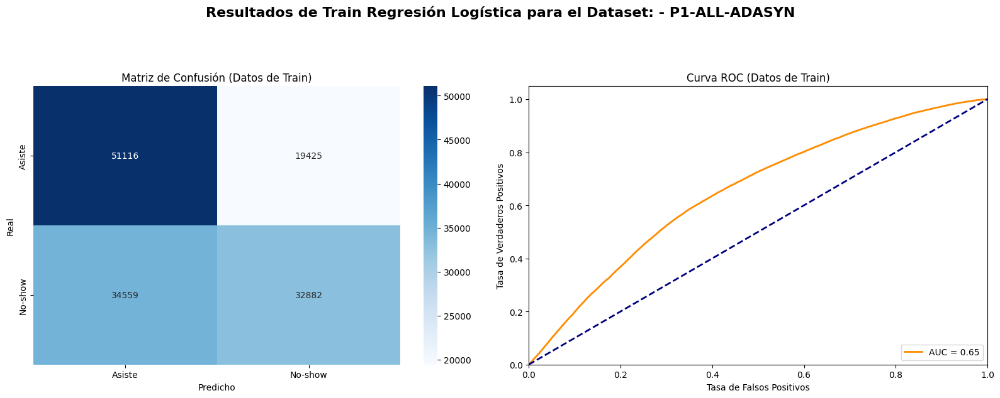

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6456985111101055
Precision (Datos de Test): 0.3069692801467217
Recall (Datos de Test): 0.600313830979601
F1 Score (Datos de Test): 0.4062191884717482
[[11590  6046]
 [ 1783  2678]]


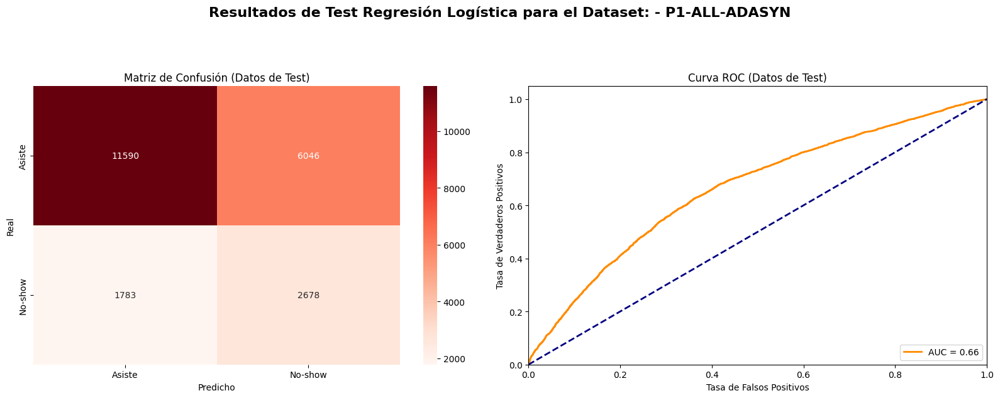

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8052499601397284
Precision (Datos de Train): 0.7664980621428102
Recall (Datos de Train): 0.8650820717367773
F1 Score (Datos de Train): 0.812811725041099
[[52768 17773]
 [ 9099 58342]]


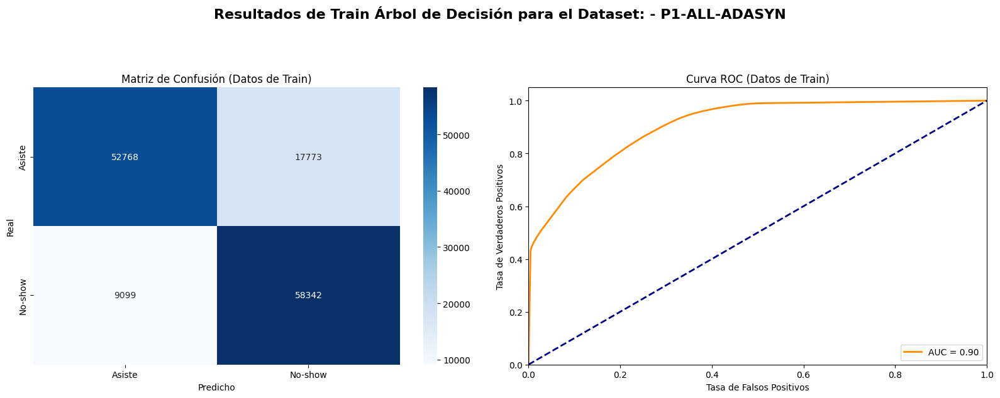

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6504050323573336
Precision (Datos de Test): 0.28688952729172107
Recall (Datos de Test): 0.49249047298811927
F1 Score (Datos de Test): 0.362571169238386
[[12175  5461]
 [ 2264  2197]]


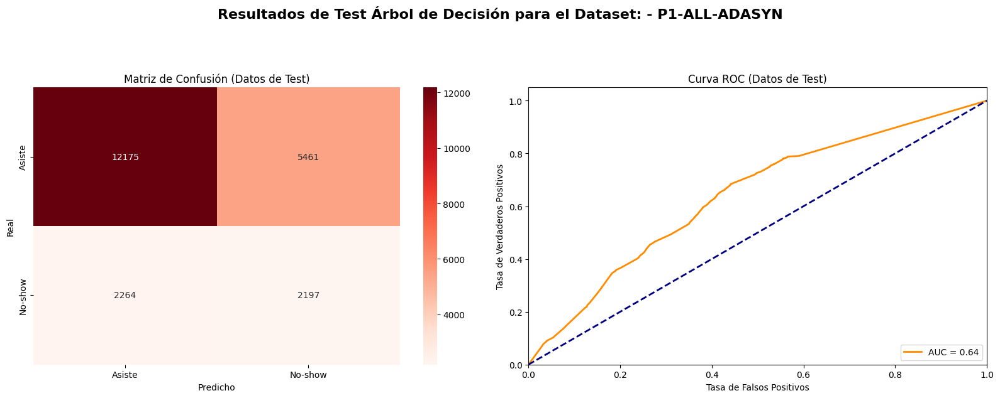

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.683400733428998
Precision (Datos de Train): 0.6320305900137833
Recall (Datos de Train): 0.8431073086104892
F1 Score (Datos de Train): 0.7224675200914837
[[37437 33104]
 [10581 56860]]


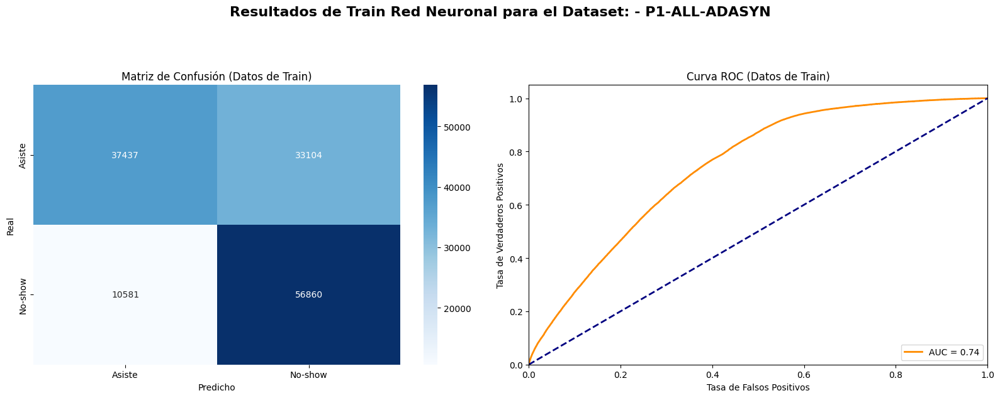

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5355930669321627
Precision (Datos de Test): 0.28051456678017406
Recall (Datos de Test): 0.830979600986326
F1 Score (Datos de Test): 0.419438787055895
[[8128 9508]
 [ 754 3707]]


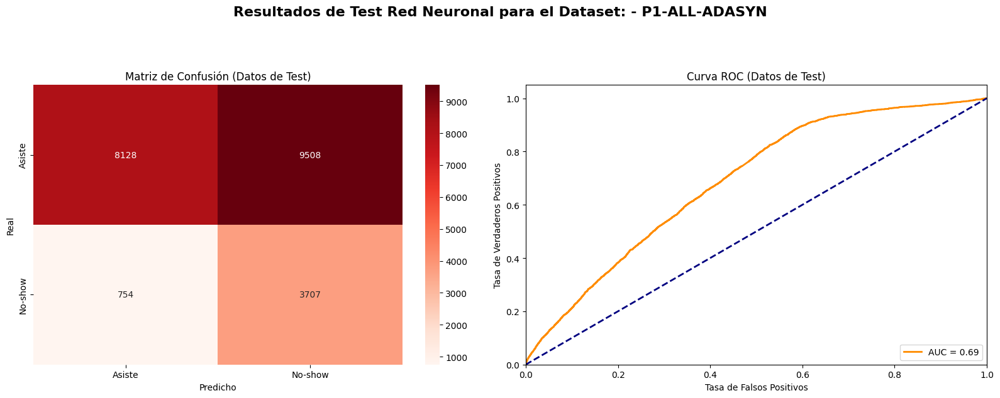

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6913293038222377
Precision (Datos de Train): 0.6325842456836759
Recall (Datos de Train): 0.8790201806023042
F1 Score (Datos de Train): 0.7357140640997797
[[36109 34432]
 [ 8159 59282]]


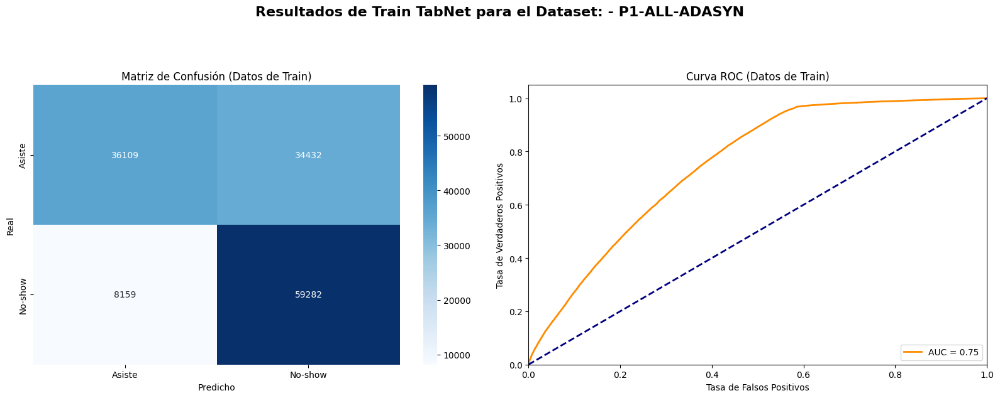

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.588993981083405
Precision (Datos de Test): 0.3019288469781397
Recall (Datos de Test): 0.7895090786819099
F1 Score (Datos de Test): 0.4368101203026169
[[9493 8143]
 [ 939 3522]]


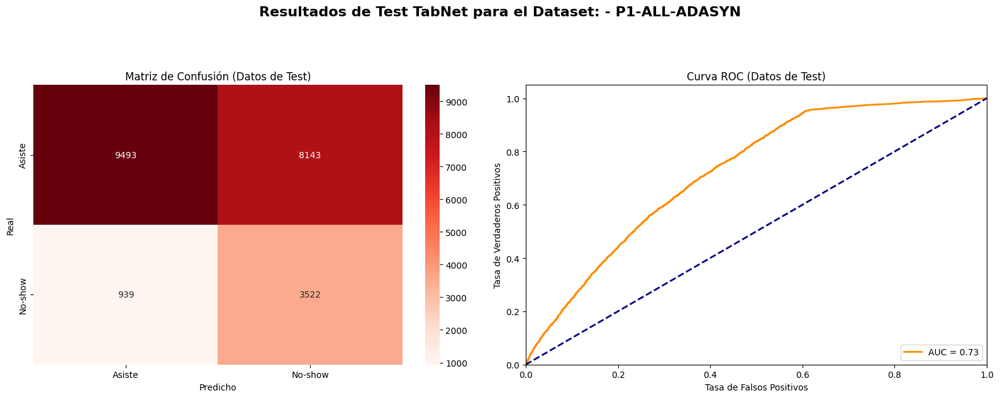


Ejecutando modelo para el dataset: P1-ALL

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6390387560372246
Precision (Datos de Train): 0.6369383265481579
Recall (Datos de Train): 0.44351516005211816
F1 Score (Datos de Train): 0.5229134013556015
[[56183 14358]
 [31605 25189]]


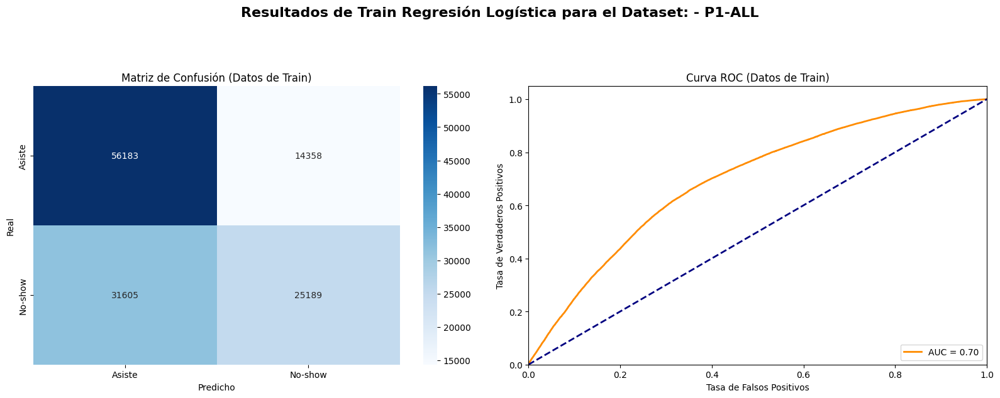

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6772412544689325
Precision (Datos de Test): 0.32047318187928486
Recall (Datos de Test): 0.5344093252633939
F1 Score (Datos de Test): 0.400672268907563
[[12581  5055]
 [ 2077  2384]]


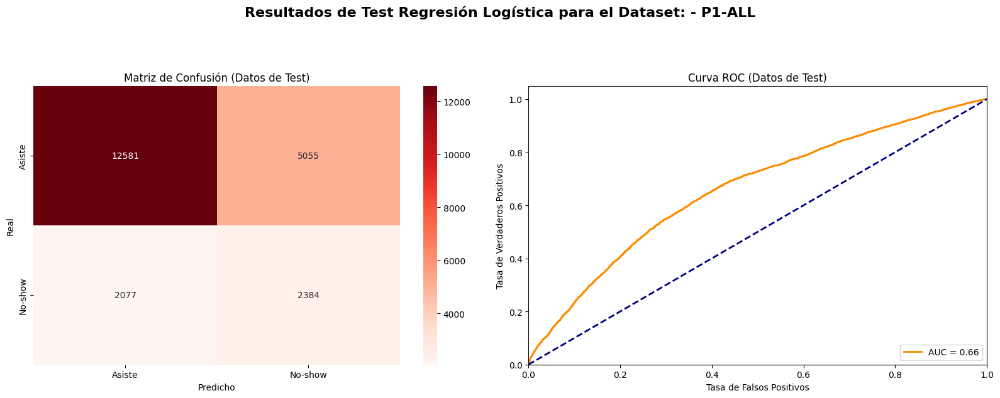

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8486826088663761
Precision (Datos de Train): 0.8266425263744298
Recall (Datos de Train): 0.8360742331936473
F1 Score (Datos de Train): 0.8313316292587275
[[60583  9958]
 [ 9310 47484]]


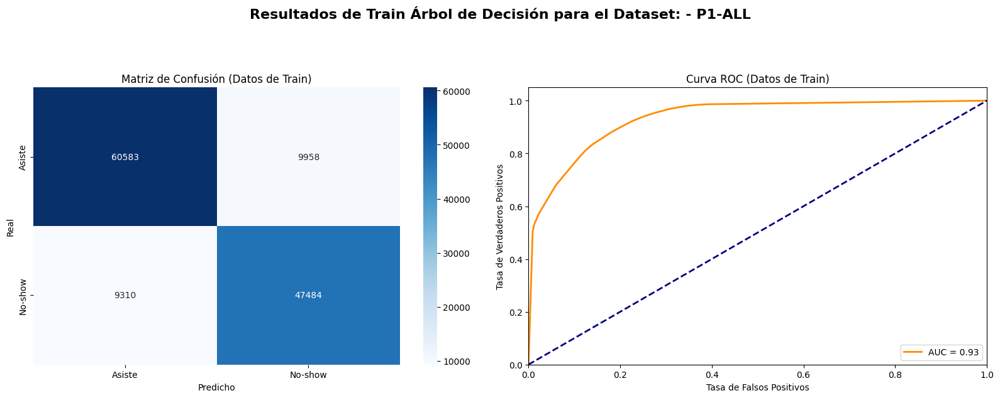

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7104584332714848
Precision (Datos de Test): 0.31139240506329113
Recall (Datos de Test): 0.35843981170141226
F1 Score (Datos de Test): 0.33326385994164237
[[14100  3536]
 [ 2862  1599]]


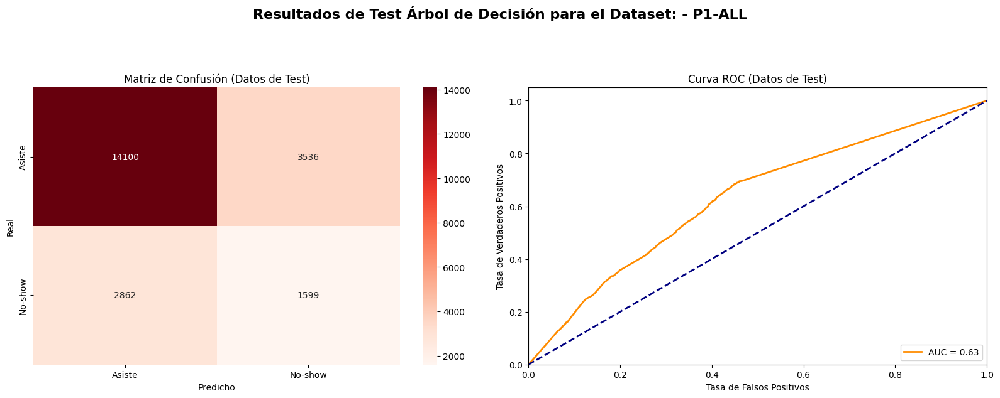

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7115325715631995
Precision (Datos de Train): 0.6491288058991437
Recall (Datos de Train): 0.7687959995774202
F1 Score (Datos de Train): 0.7039126860017089
[[46940 23601]
 [13131 43663]]


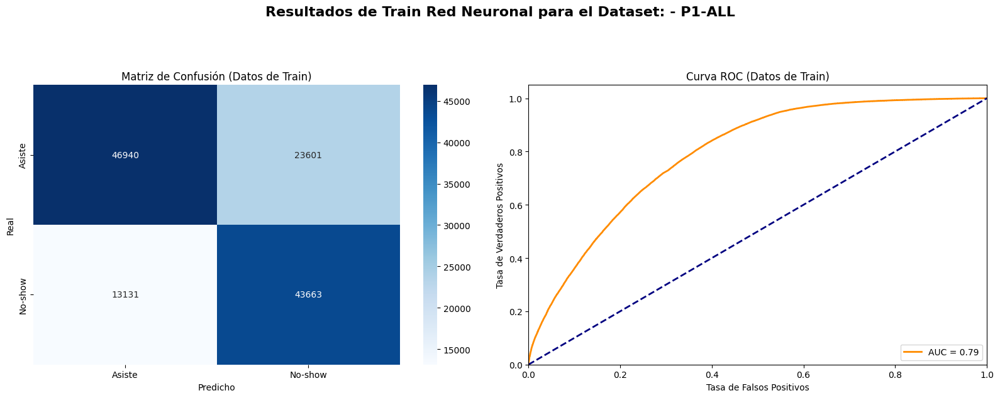

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5945603475584921
Precision (Datos de Test): 0.2876699395770393
Recall (Datos de Test): 0.6830307106030038
F1 Score (Datos de Test): 0.40483624526672424
[[10091  7545]
 [ 1414  3047]]


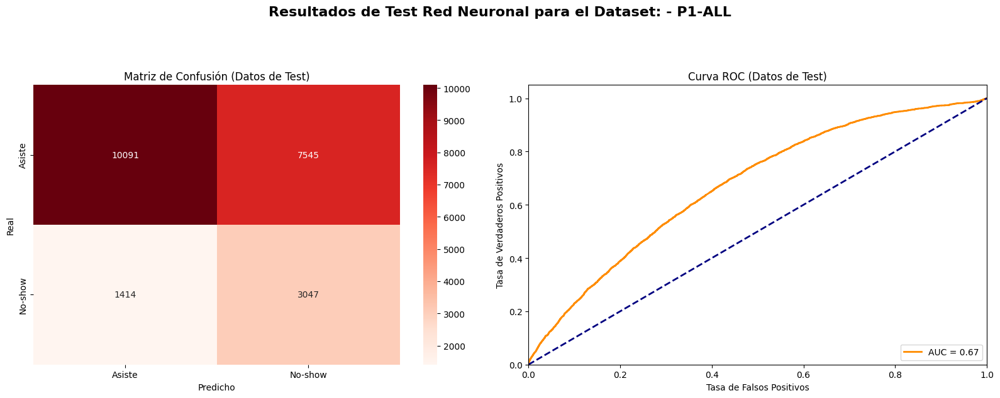

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6896140102878234
Precision (Datos de Train): 0.6138782292202397
Recall (Datos de Train): 0.8196464415255132
F1 Score (Datos de Train): 0.7019943449575872
[[41261 29280]
 [10243 46551]]


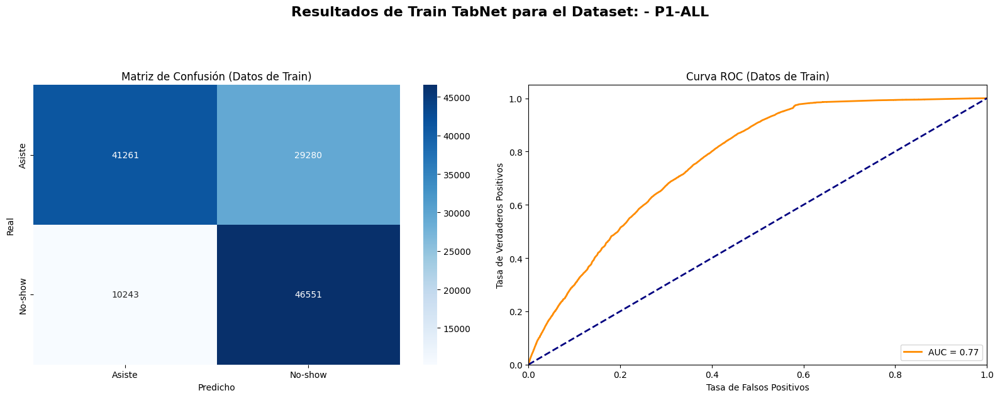

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5795809385889488
Precision (Datos de Test): 0.2980005019660336
Recall (Datos de Test): 0.7984756780990809
F1 Score (Datos de Test): 0.4340197392469843
[[9245 8391]
 [ 899 3562]]


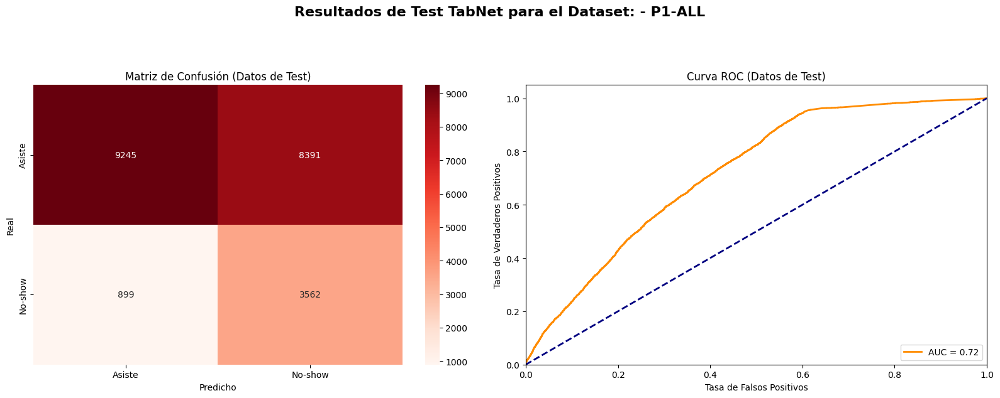


Ejecutando modelo para el dataset: P2-NOCONDITIONS

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 10, 'max_iter': 200, 'solver': 'sag'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.639138372434633
Precision (Datos de Train): 0.6317893010862882
Recall (Datos de Train): 0.43921726946733475
F1 Score (Datos de Train): 0.5181906056063769
[[42420 10779]
 [23614 18495]]


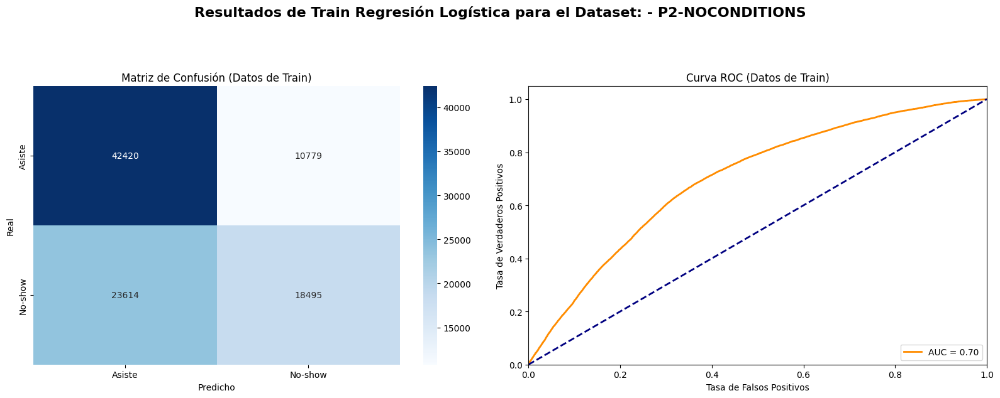

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6745347523633985
Precision (Datos de Test): 0.32744924977934686
Recall (Datos de Test): 0.5271383915885195
F1 Score (Datos de Test): 0.40396341463414637
[[9490 3810]
 [1664 1855]]


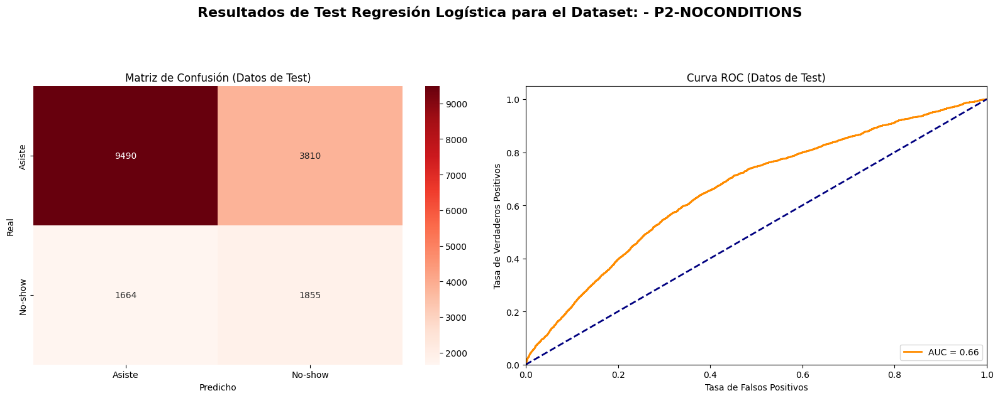

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8364775254962857
Precision (Datos de Train): 0.8195046737978221
Recall (Datos de Train): 0.8078083070127526
F1 Score (Datos de Train): 0.8136144563904469
[[45707  7492]
 [ 8093 34016]]


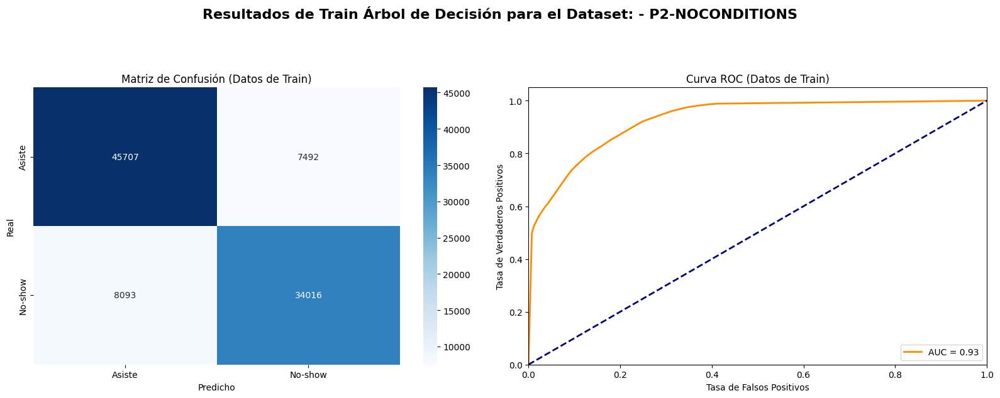

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.724656638325703
Precision (Datos de Test): 0.340870062965083
Recall (Datos de Test): 0.33844842284739984
F1 Score (Datos de Test): 0.33965492656495083
[[10997  2303]
 [ 2328  1191]]


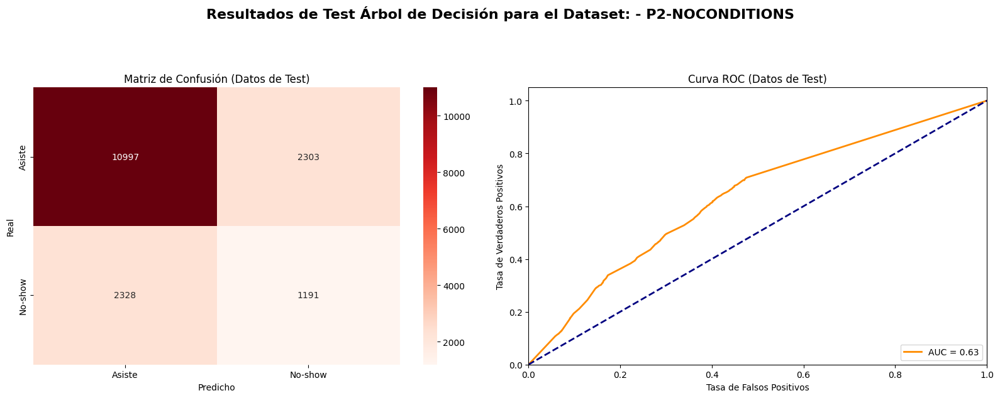

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7193834725311621
Precision (Datos de Train): 0.6588502894954508
Recall (Datos de Train): 0.7566553468379681
F1 Score (Datos de Train): 0.7043738739236645
[[36701 16498]
 [10247 31862]]


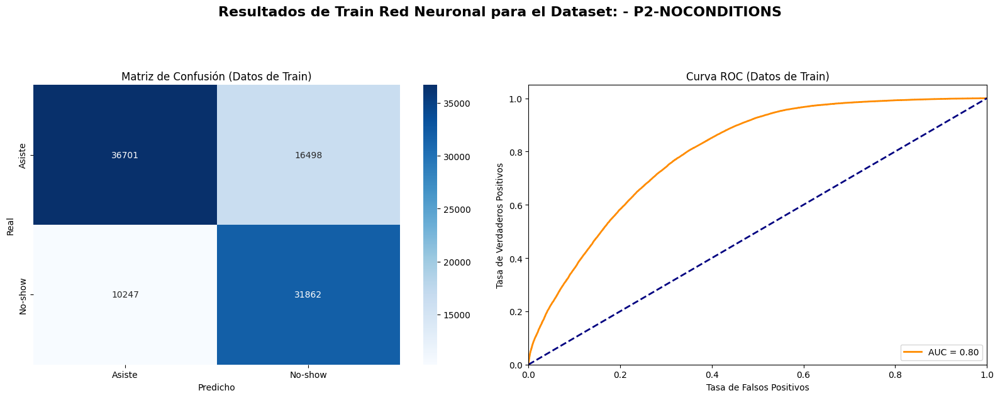

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6187050359712231
Precision (Datos de Test): 0.3111951983298539
Recall (Datos de Test): 0.6777493606138107
F1 Score (Datos de Test): 0.4265402843601896
[[8021 5279]
 [1134 2385]]


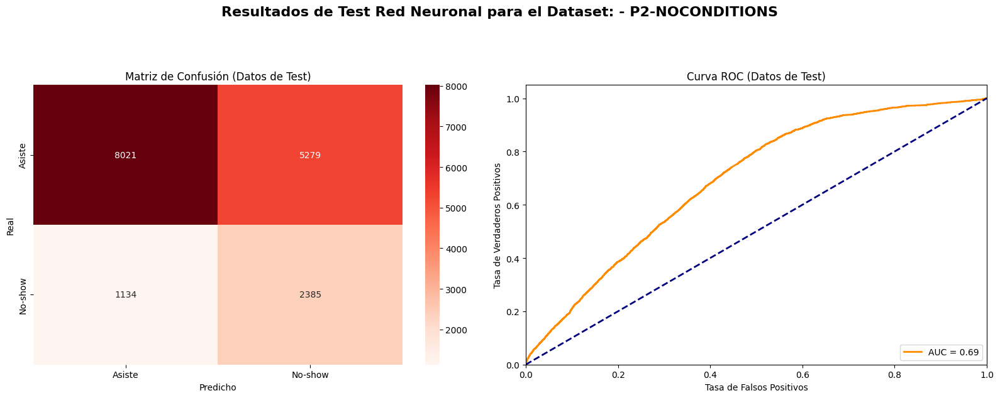

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7092059428379569
Precision (Datos de Train): 0.6389596848934198
Recall (Datos de Train): 0.7858890023510413
F1 Score (Datos de Train): 0.7048487236557651
[[34500 18699]
 [ 9016 33093]]


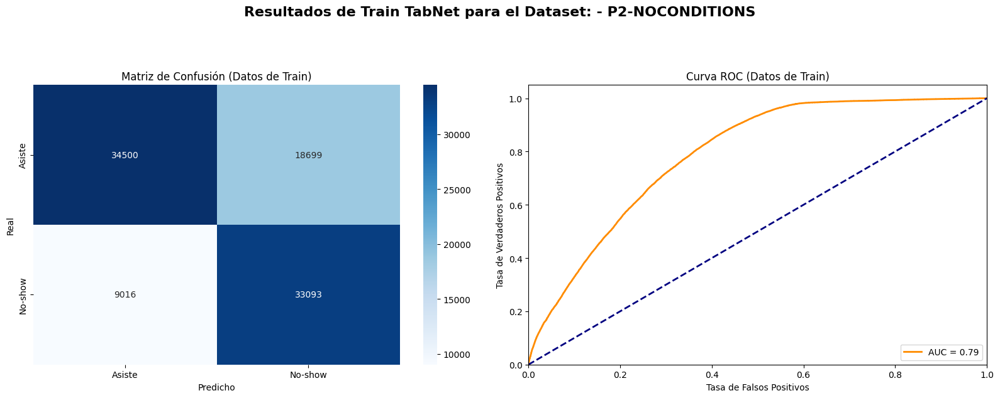

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6414174445567513
Precision (Datos de Test): 0.32704489121454144
Recall (Datos de Test): 0.6749076442171071
F1 Score (Datos de Test): 0.4405899267229385
[[8413 4887]
 [1144 2375]]


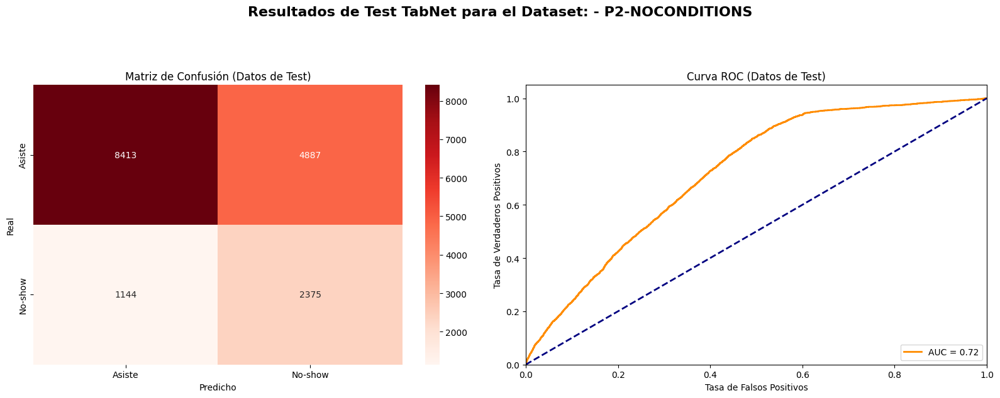


Ejecutando modelo para el dataset: P3-AGE

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6431497621731599
Precision (Datos de Train): 0.6313422094278518
Recall (Datos de Train): 0.4414114095226115
F1 Score (Datos de Train): 0.5195632056265038
[[16374  4098]
 [ 8881  7018]]


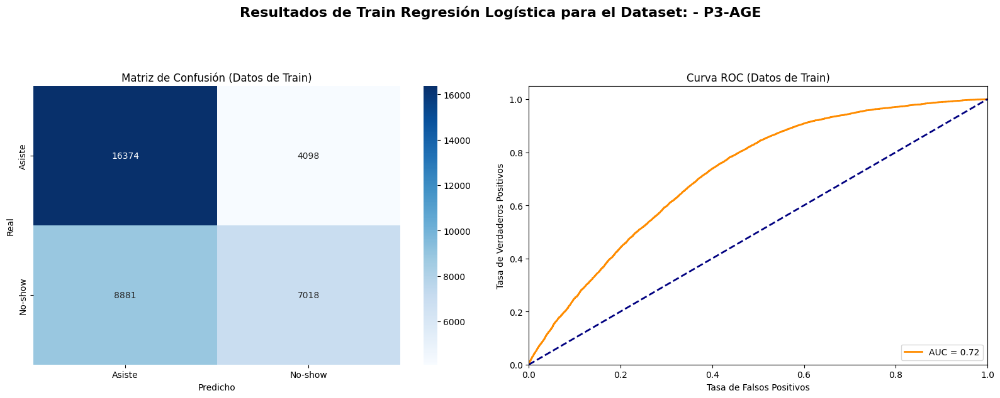

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6893347101342381
Precision (Datos de Test): 0.39761248852157943
Recall (Datos de Test): 0.5216867469879518
F1 Score (Datos de Test): 0.4512767066180302
[[3807 1312]
 [ 794  866]]


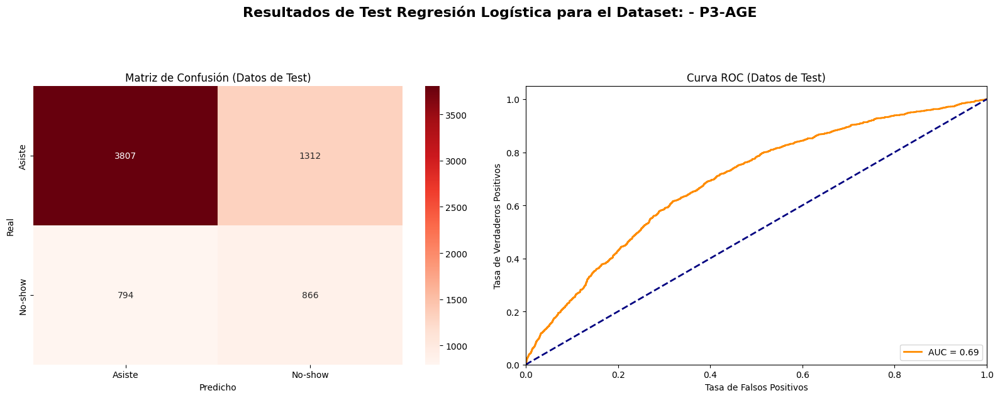

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8341535838992604
Precision (Datos de Train): 0.7706698853349426
Recall (Datos de Train): 0.8835146864582678
F1 Score (Datos de Train): 0.8232432749223466
[[16292  4180]
 [ 1852 14047]]


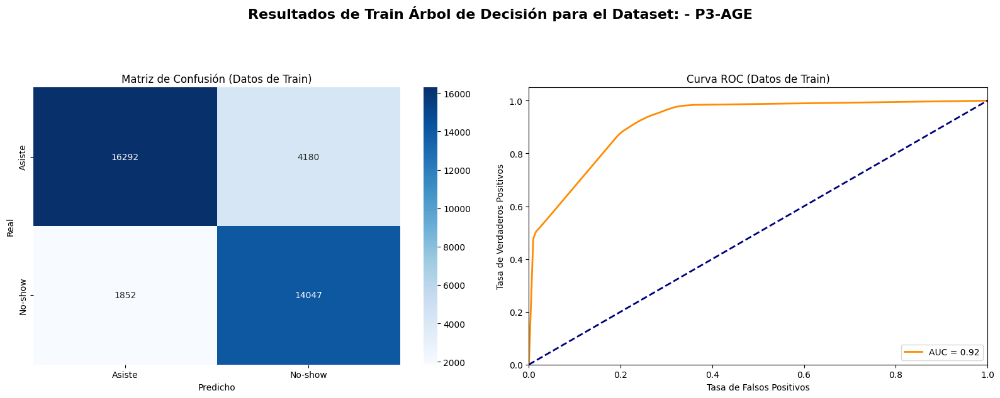

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6915474258740227
Precision (Datos de Test): 0.38100496963003866
Recall (Datos de Test): 0.41566265060240964
F1 Score (Datos de Test): 0.3975799481417459
[[3998 1121]
 [ 970  690]]


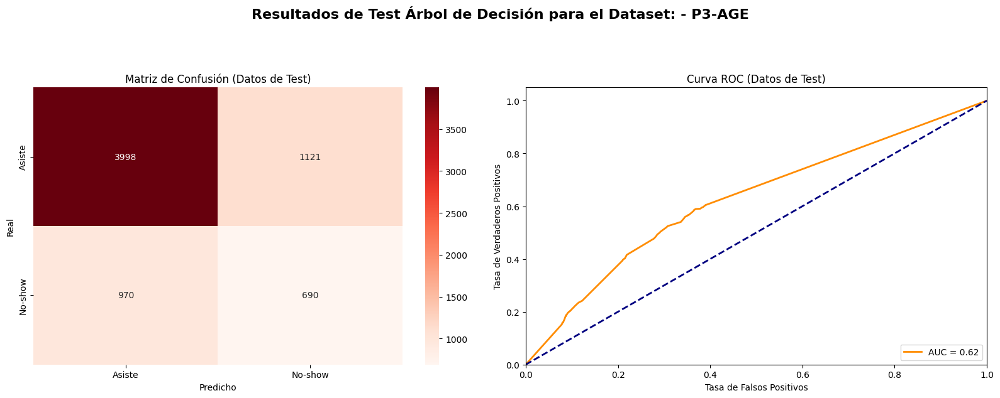

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7190618899672816
Precision (Datos de Train): 0.645928589776522
Recall (Datos de Train): 0.7908044531102585
F1 Score (Datos de Train): 0.7110620970478453
[[13580  6892]
 [ 3326 12573]]


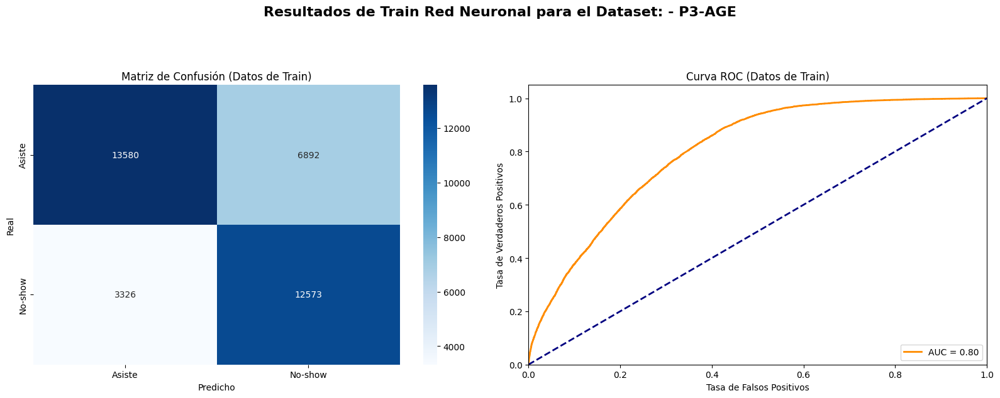

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6183802920784777
Precision (Datos de Test): 0.3536469845279444
Recall (Datos de Test): 0.6746987951807228
F1 Score (Datos de Test): 0.4640563496996064
[[3072 2047]
 [ 540 1120]]


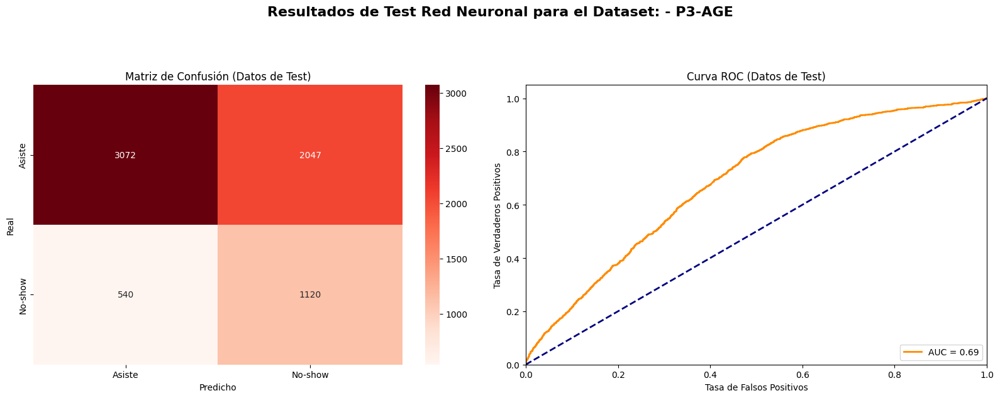

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6859036045200847
Precision (Datos de Train): 0.6020338364722514
Recall (Datos de Train): 0.8303666897289138
F1 Score (Datos de Train): 0.6980014803849001
[[11745  8727]
 [ 2697 13202]]


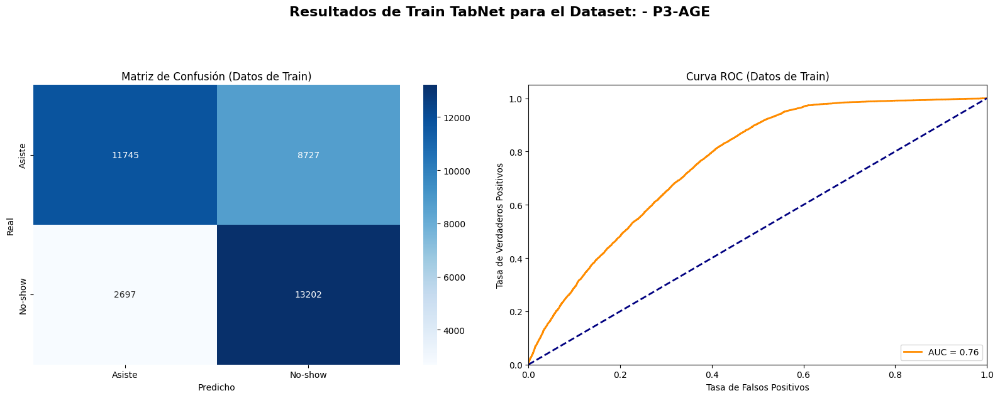

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6318041008998377
Precision (Datos de Test): 0.3667941363926068
Recall (Datos de Test): 0.6933734939759036
F1 Score (Datos de Test): 0.47978324301792413
[[3132 1987]
 [ 509 1151]]


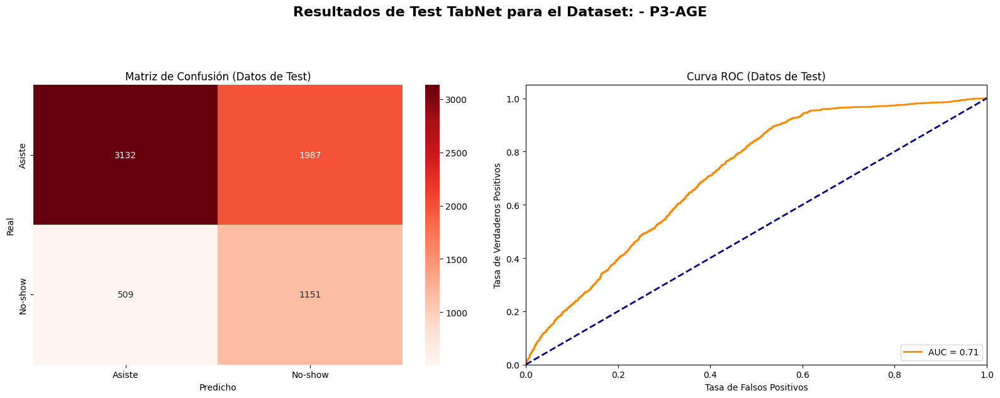


Ejecutando modelo para el dataset: P4-TIME

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 0.01, 'max_iter': 100, 'solver': 'lbfgs'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6278060006078764
Precision (Datos de Train): 0.5902984474298125
Recall (Datos de Train): 0.2624369657737563
F1 Score (Datos de Train): 0.363339275103981
[[36039  5093]
 [20623  7338]]


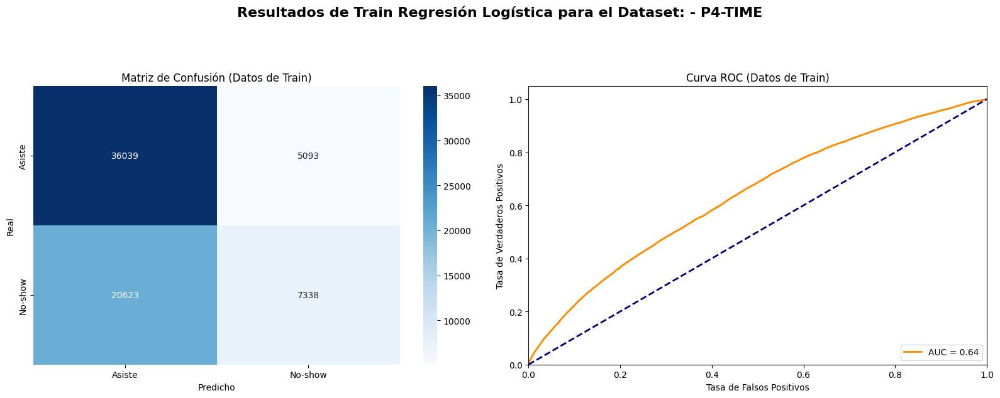

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6736878693083073
Precision (Datos de Test): 0.3885542168674699
Recall (Datos de Test): 0.2515845928815212
F1 Score (Datos de Test): 0.30541580349215747
[[8659 1624]
 [3070 1032]]


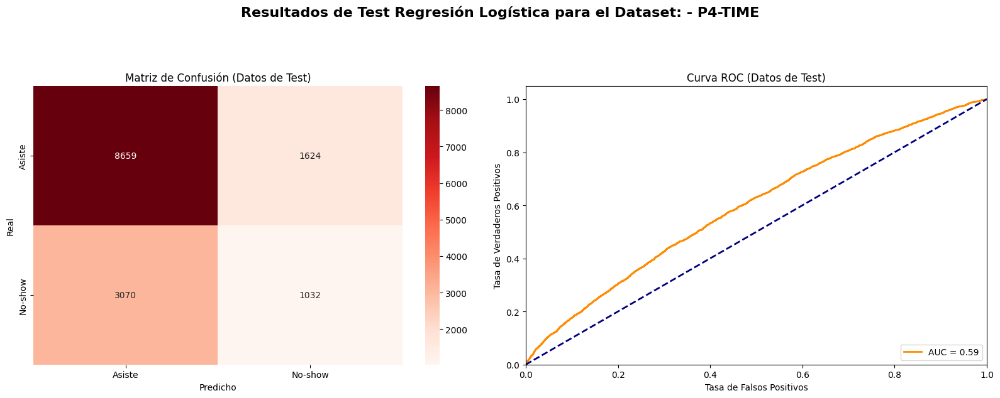

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8113991287105785
Precision (Datos de Train): 0.8837257119358487
Recall (Datos de Train): 0.6148564071385143
F1 Score (Datos de Train): 0.7251713592744912
[[38870  2262]
 [10769 17192]]


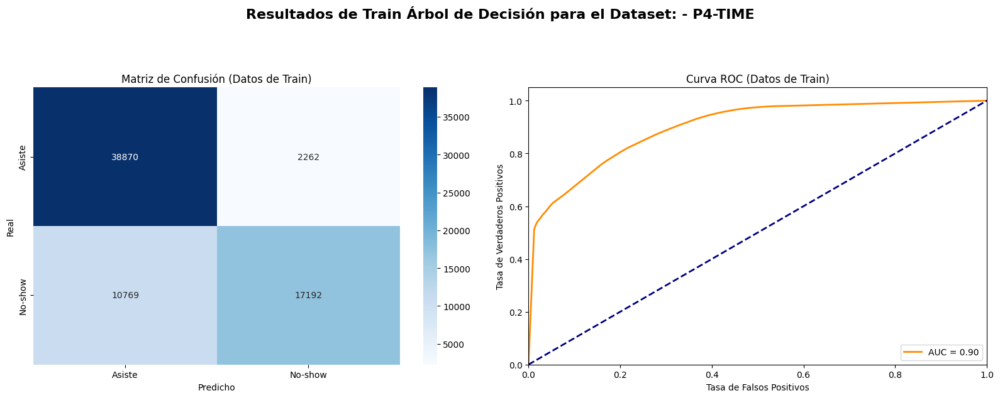

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6511644073687869
Precision (Datos de Test): 0.3176751592356688
Recall (Datos de Test): 0.1945392491467577
F1 Score (Datos de Test): 0.24130631992742668
[[8569 1714]
 [3304  798]]


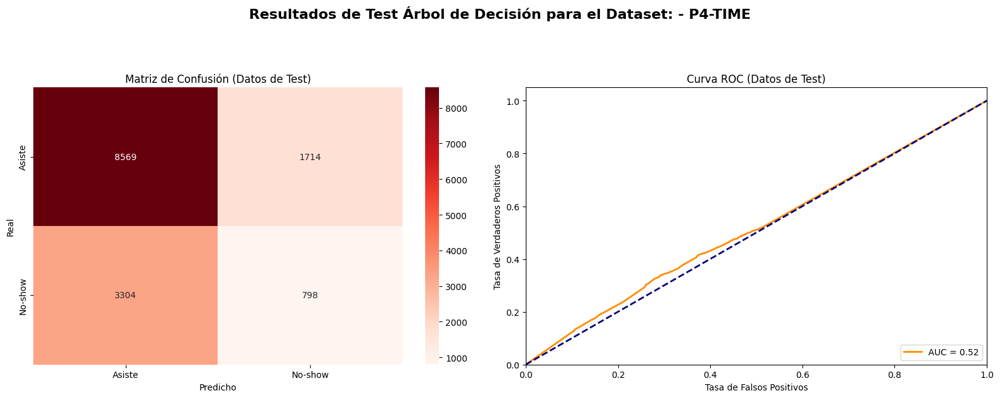

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6682153040105365
Precision (Datos de Train): 0.650421071492564
Recall (Datos de Train): 0.3894710489610529
F1 Score (Datos de Train): 0.48720472440944884
[[35279  5853]
 [17071 10890]]


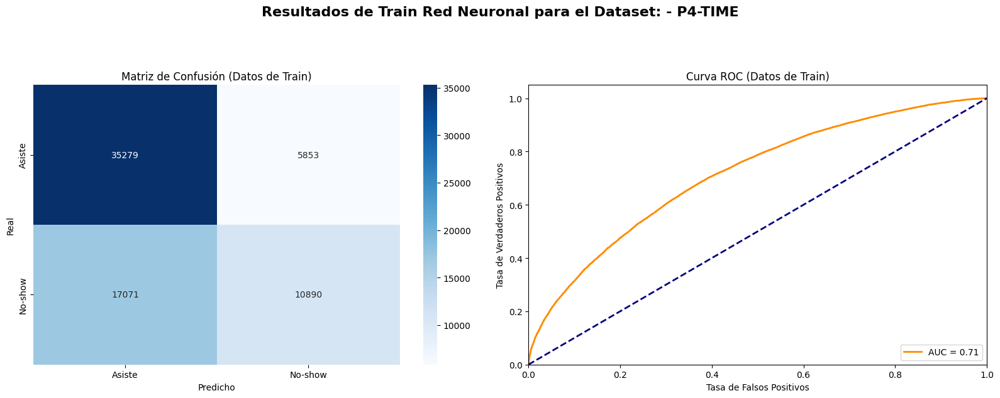

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6470629127563434
Precision (Datos de Test): 0.36447039199332776
Recall (Datos de Test): 0.3196001950268162
F1 Score (Datos de Test): 0.3405637095726718
[[7997 2286]
 [2791 1311]]


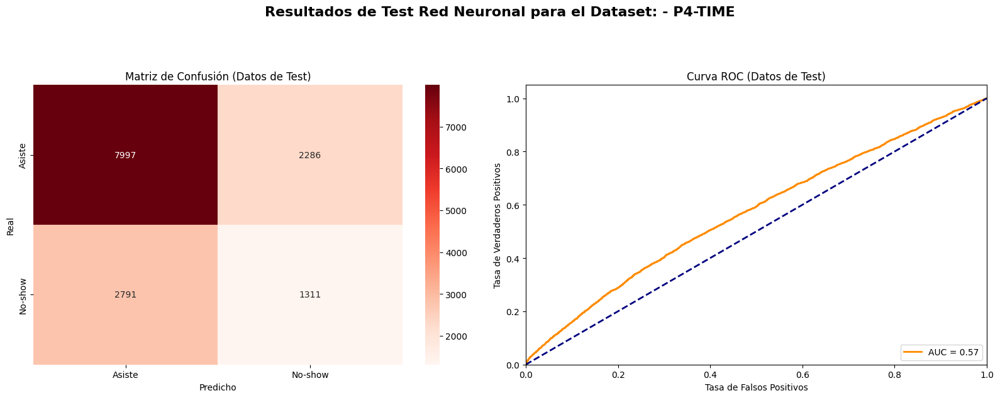

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6439002503871594
Precision (Datos de Train): 0.6055063171789553
Recall (Datos de Train): 0.34451557526554843
F1 Score (Datos de Train): 0.43916115796671984
[[34856  6276]
 [18328  9633]]


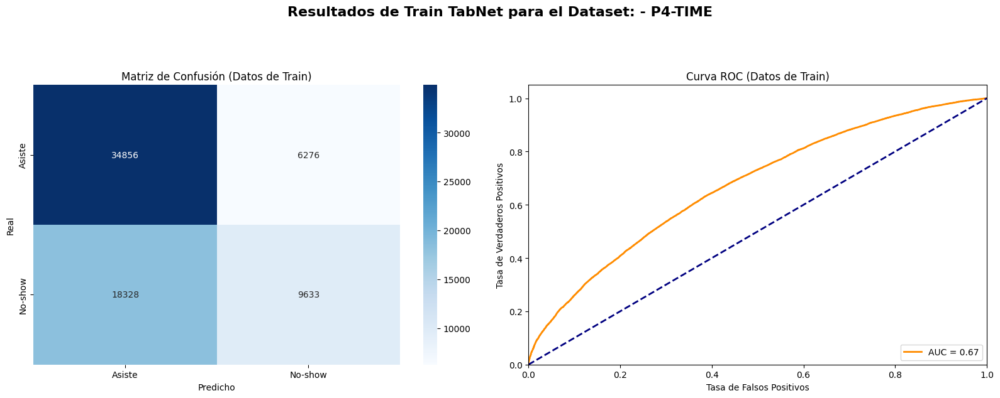

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6967674661105318
Precision (Datos de Test): 0.39666136724960255
Recall (Datos de Test): 0.12164797659678206
F1 Score (Datos de Test): 0.18619402985074626
[[9524  759]
 [3603  499]]


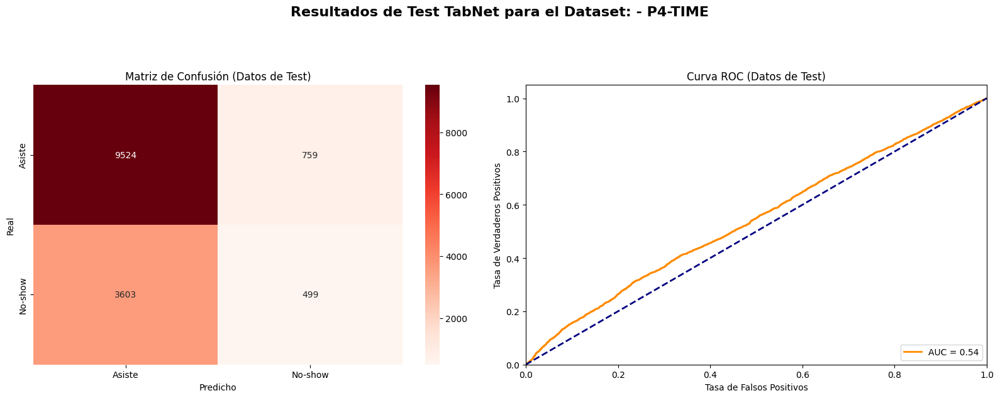


Ejecutando modelo para el dataset: P5-HEALTHCENTRE

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6466068985733828
Precision (Datos de Train): 0.6444564964747811
Recall (Datos de Train): 0.4571459976367783
F1 Score (Datos de Train): 0.5348766176352383
[[36303  9178]
 [19755 16636]]


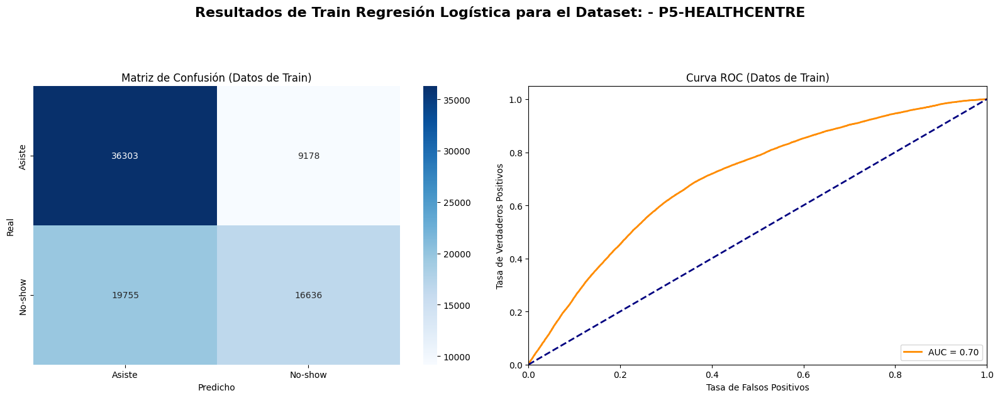

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6919195458686663
Precision (Datos de Test): 0.33115271824949244
Recall (Datos de Test): 0.5063815108658158
F1 Score (Datos de Test): 0.4004364429896345
[[8405 2965]
 [1431 1468]]


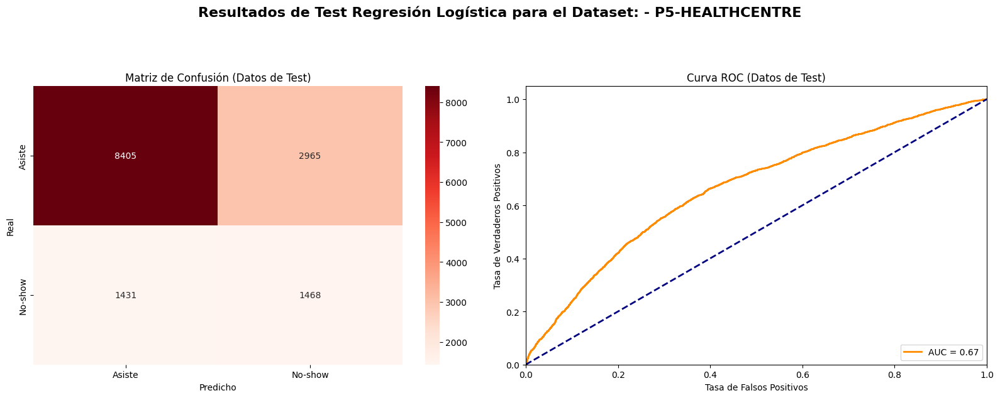

Modelo cargado exitosamente.
Mejores hiperparámetros cargados: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8356336720734806
Precision (Datos de Train): 0.8012557797393863
Recall (Datos de Train): 0.8380918358934901
F1 Score (Datos de Train): 0.8192599556779263
[[37916  7565]
 [ 5892 30499]]


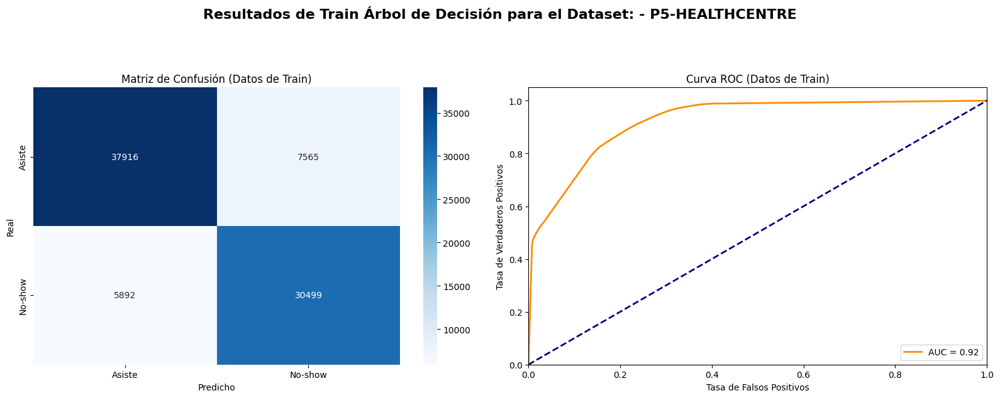

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7168687364216133
Precision (Datos de Test): 0.3373253493013972
Recall (Datos de Test): 0.4080717488789238
F1 Score (Datos de Test): 0.3693412425850765
[[9046 2324]
 [1716 1183]]


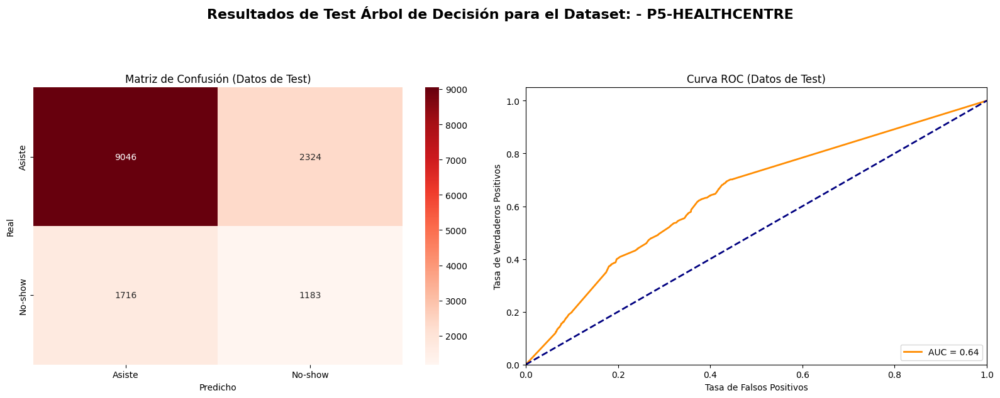

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7233608559702951
Precision (Datos de Train): 0.658830328247804
Recall (Datos de Train): 0.7831881509164353
F1 Score (Datos de Train): 0.7156470100814805
[[30722 14759]
 [ 7890 28501]]


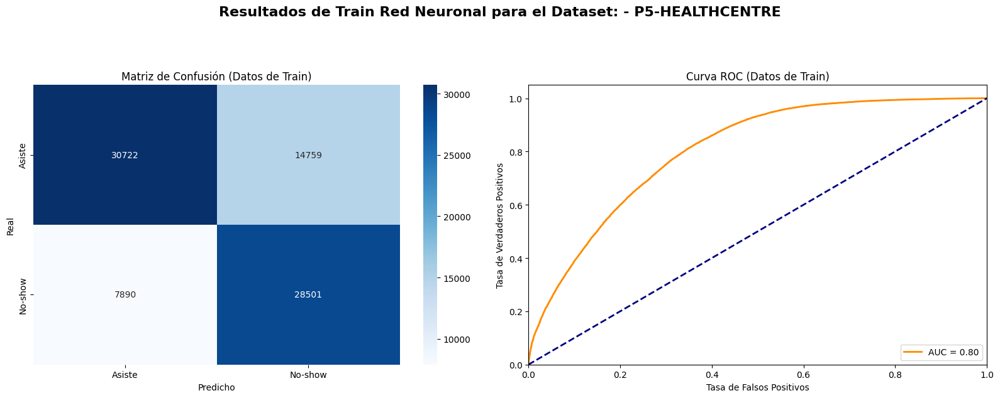

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6136379564089985
Precision (Datos de Test): 0.3053321417932678
Recall (Datos de Test): 0.707140393239048
F1 Score (Datos de Test): 0.42650577343181106
[[6706 4664]
 [ 849 2050]]


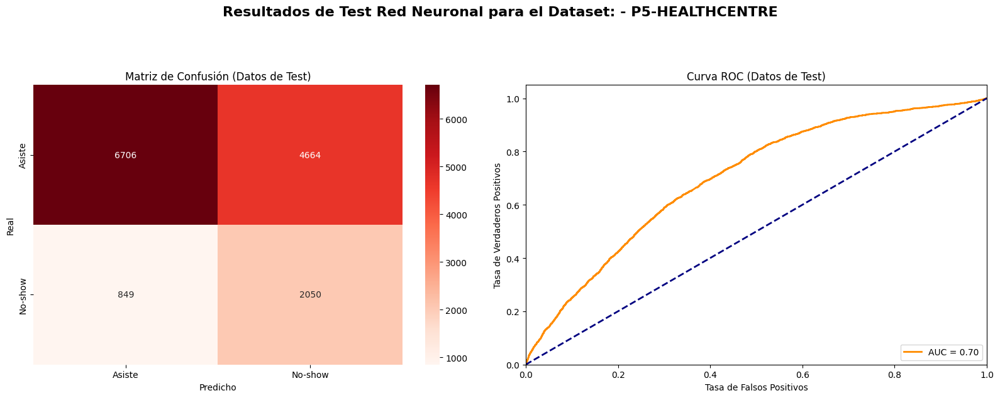

Modelo cargado exitosamente.
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7154338479577877
Precision (Datos de Train): 0.6544459386132541
Recall (Datos de Train): 0.7622763870187684
F1 Score (Datos de Train): 0.7042575338292416
[[30834 14647]
 [ 8651 27740]]


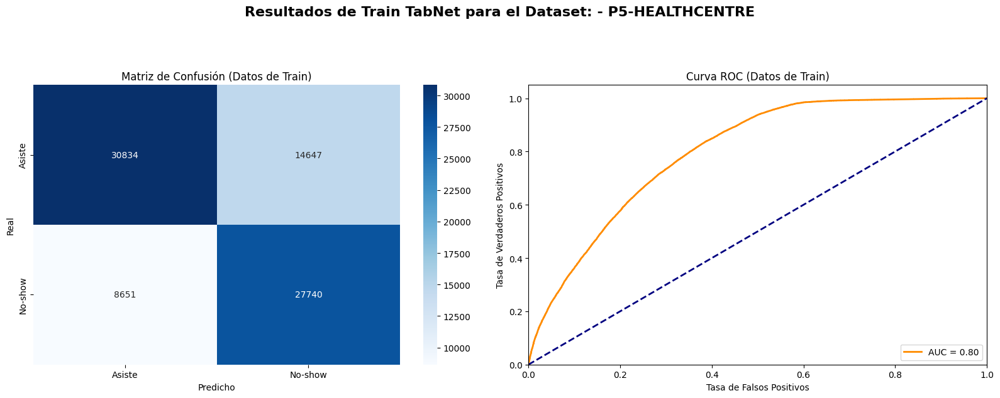

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6841404443198542
Precision (Datos de Test): 0.3414826498422713
Recall (Datos de Test): 0.5974473956536737
F1 Score (Datos de Test): 0.4345753355915193
[[8030 3340]
 [1167 1732]]


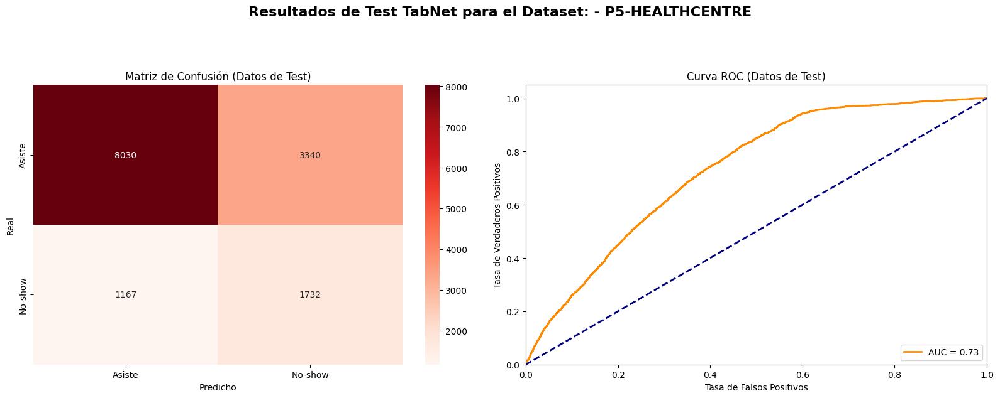


Ejecutando modelo para el dataset: P6A-KIDS

Mejores hiperparámetros: {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
Mejor puntaje de validación: 0.6782874617737003
Modelo guardado en models\modelo_logistic_regression_P6A-KIDS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6640433860707878
Precision (Datos de Train): 0.6686824049308059
Recall (Datos de Train): 0.5161579892280072
F1 Score (Datos de Train): 0.5826029687420842
[[10535  2849]
 [ 5390  5750]]


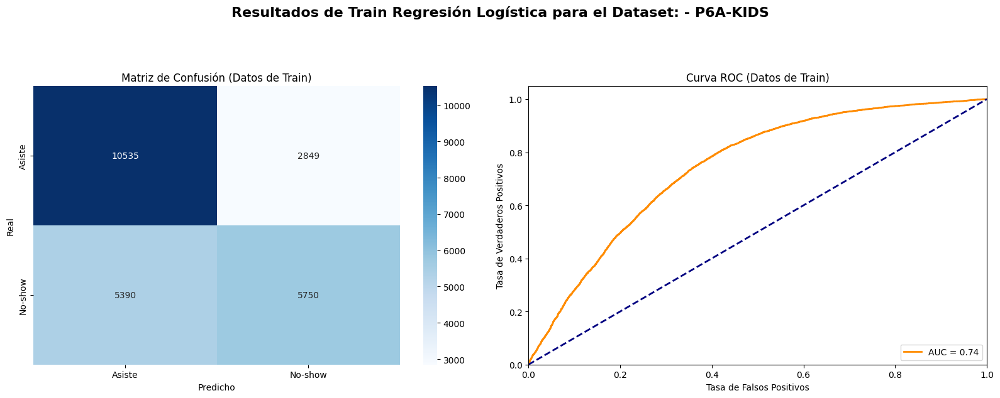

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6895650106964583
Precision (Datos de Test): 0.34559333795975017
Recall (Datos de Test): 0.578397212543554
F1 Score (Datos de Test): 0.4326672458731538
[[2403  943]
 [ 363  498]]


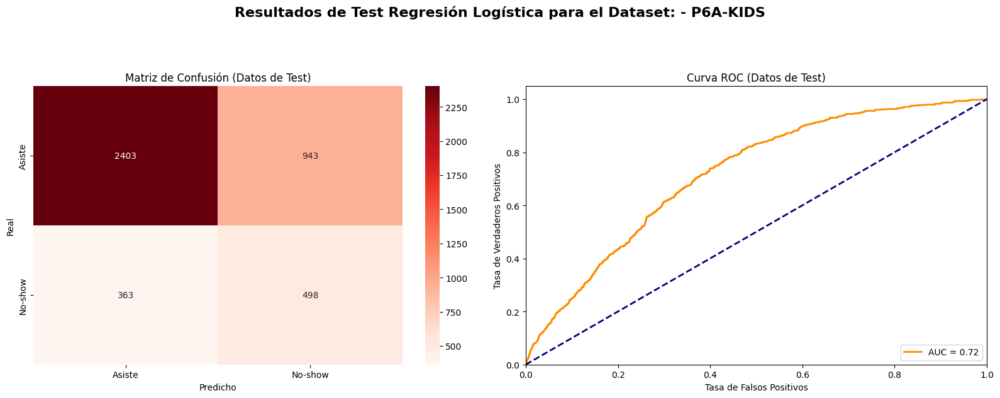

Mejores hiperparámetros: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
Mejor puntaje de validación: 0.8232415902140673
Modelo guardado en models\modelo_decision_tree_P6A-KIDS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8961017778502691
Precision (Datos de Train): 0.8964562569213732
Recall (Datos de Train): 0.8719928186714542
F1 Score (Datos de Train): 0.8840553330906443
[[12262  1122]
 [ 1426  9714]]


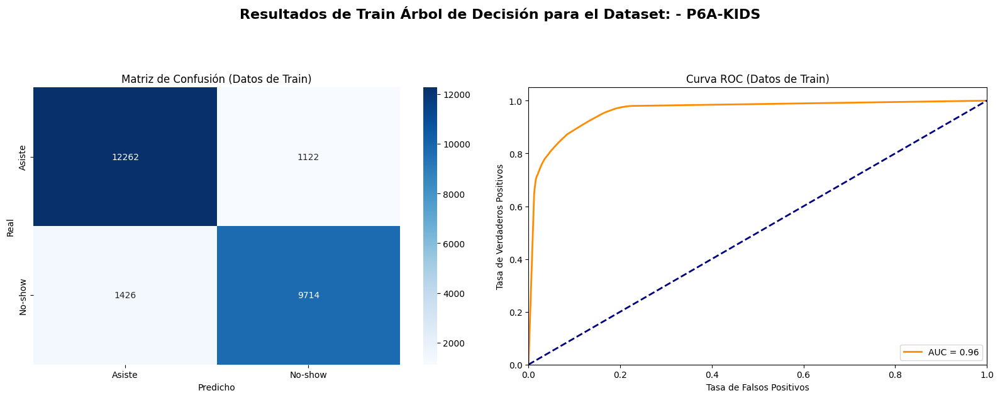

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7271214642262895
Precision (Datos de Test): 0.3104359313077939
Recall (Datos de Test): 0.27293844367015097
F1 Score (Datos de Test): 0.2904820766378245
[[2824  522]
 [ 626  235]]


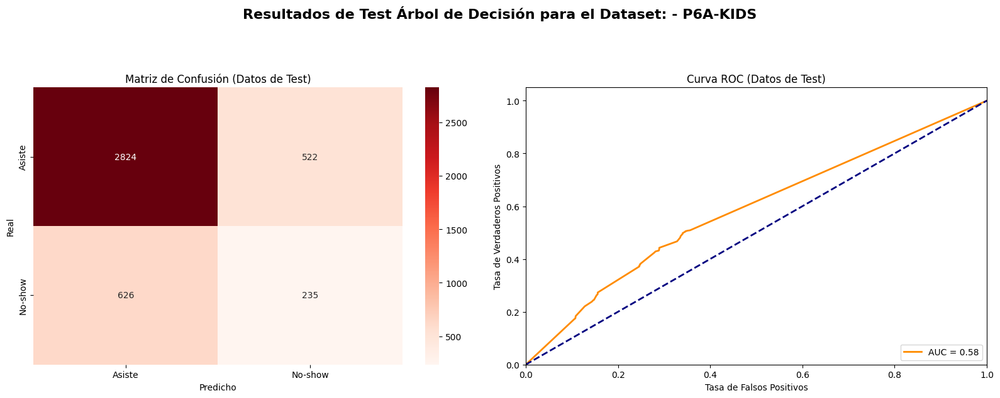

Comenzando el fold 1
Fold 1, Epoch 1, Train Loss: 0.6953, Val Loss: 0.6515
Fold 1, Epoch 2, Train Loss: 0.6533, Val Loss: 0.6262
Fold 1, Epoch 3, Train Loss: 0.6304, Val Loss: 0.6134
Fold 1, Epoch 4, Train Loss: 0.6169, Val Loss: 0.6053
Fold 1, Epoch 5, Train Loss: 0.6069, Val Loss: 0.5946
Fold 1, Epoch 6, Train Loss: 0.6018, Val Loss: 0.5888
Fold 1, Epoch 7, Train Loss: 0.5917, Val Loss: 0.5826
Fold 1, Epoch 8, Train Loss: 0.5887, Val Loss: 0.5794
Fold 1, Epoch 9, Train Loss: 0.5863, Val Loss: 0.5761
Fold 1, Epoch 10, Train Loss: 0.5834, Val Loss: 0.5727
Fold 1, Epoch 11, Train Loss: 0.5780, Val Loss: 0.5700
Fold 1, Epoch 12, Train Loss: 0.5743, Val Loss: 0.5676
Fold 1, Epoch 13, Train Loss: 0.5707, Val Loss: 0.5660
Fold 1, Epoch 14, Train Loss: 0.5704, Val Loss: 0.5629
Fold 1, Epoch 15, Train Loss: 0.5663, Val Loss: 0.5623
Fold 1, Epoch 16, Train Loss: 0.5676, Val Loss: 0.5600
Fold 1, Epoch 17, Train Loss: 0.5669, Val Loss: 0.5591
Fold 1, Epoch 18, Train Loss: 0.5646, Val Loss: 0.559

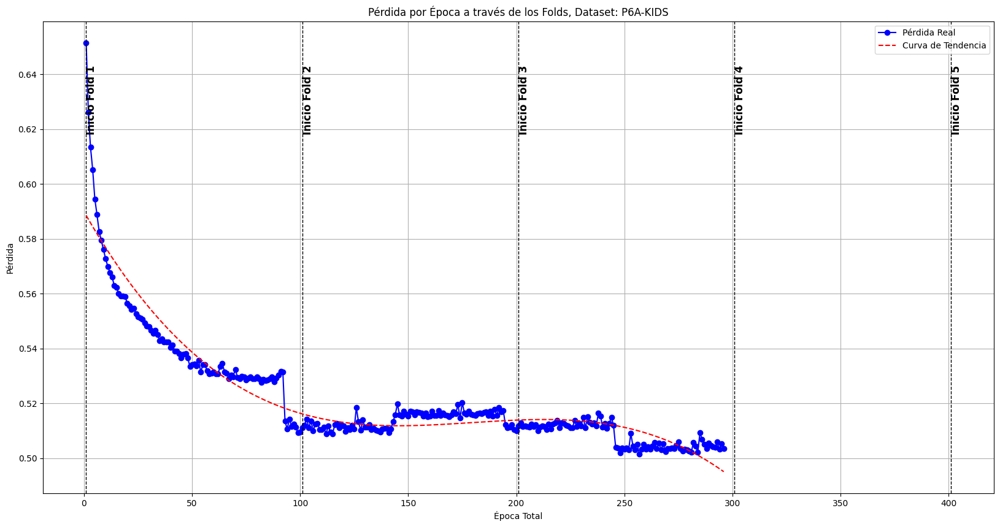

..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7319768390148426
Precision (Datos de Train): 0.6630489111031774
Recall (Datos de Train): 0.8335727109515261
F1 Score (Datos de Train): 0.7385961423742294
[[8665 4719]
 [1854 9286]]


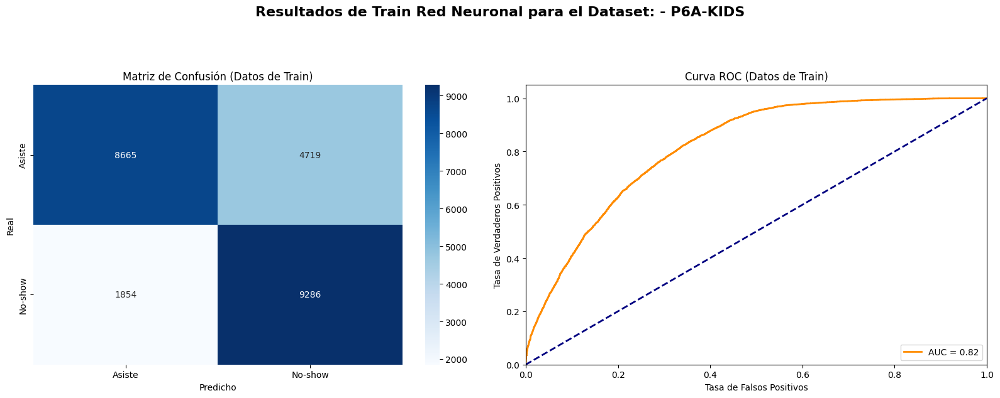

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6855241264559068
Precision (Datos de Test): 0.35096774193548386
Recall (Datos de Test): 0.6318234610917538
F1 Score (Datos de Test): 0.4512650352550809
[[2340 1006]
 [ 317  544]]


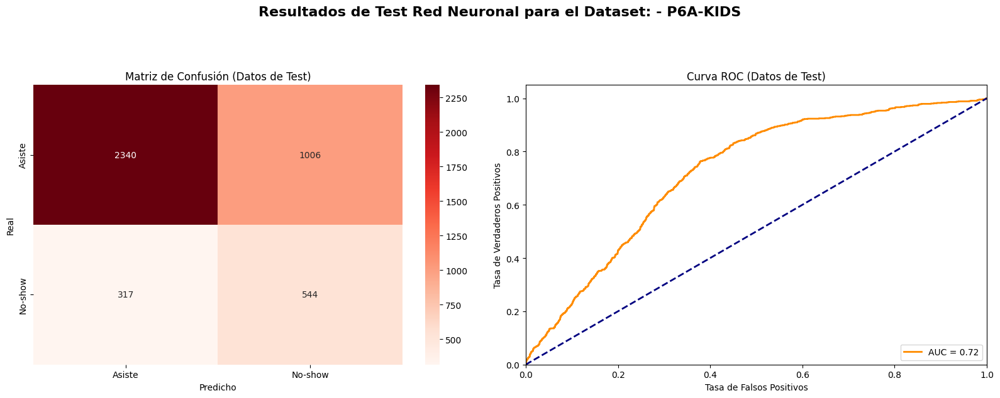

Comenzando el fold 1
epoch 0  | loss: 0.97728 | valid_auc: 0.64598 |  0:00:01s
epoch 1  | loss: 0.67715 | valid_auc: 0.72202 |  0:00:02s
epoch 2  | loss: 0.59206 | valid_auc: 0.73615 |  0:00:04s
epoch 3  | loss: 0.58118 | valid_auc: 0.74218 |  0:00:05s
epoch 4  | loss: 0.56902 | valid_auc: 0.74785 |  0:00:07s
epoch 5  | loss: 0.56338 | valid_auc: 0.76874 |  0:00:08s
epoch 6  | loss: 0.55456 | valid_auc: 0.75698 |  0:00:09s
epoch 7  | loss: 0.55452 | valid_auc: 0.7612  |  0:00:11s
epoch 8  | loss: 0.55066 | valid_auc: 0.76    |  0:00:12s
epoch 9  | loss: 0.54974 | valid_auc: 0.75534 |  0:00:13s
epoch 10 | loss: 0.5504  | valid_auc: 0.76455 |  0:00:15s
epoch 11 | loss: 0.54375 | valid_auc: 0.76838 |  0:00:16s
epoch 12 | loss: 0.53755 | valid_auc: 0.73852 |  0:00:18s
epoch 13 | loss: 0.53707 | valid_auc: 0.7727  |  0:00:19s
epoch 14 | loss: 0.53734 | valid_auc: 0.78144 |  0:00:20s
epoch 15 | loss: 0.53627 | valid_auc: 0.77218 |  0:00:22s
epoch 16 | loss: 0.53702 | valid_auc: 0.77141 |  0:

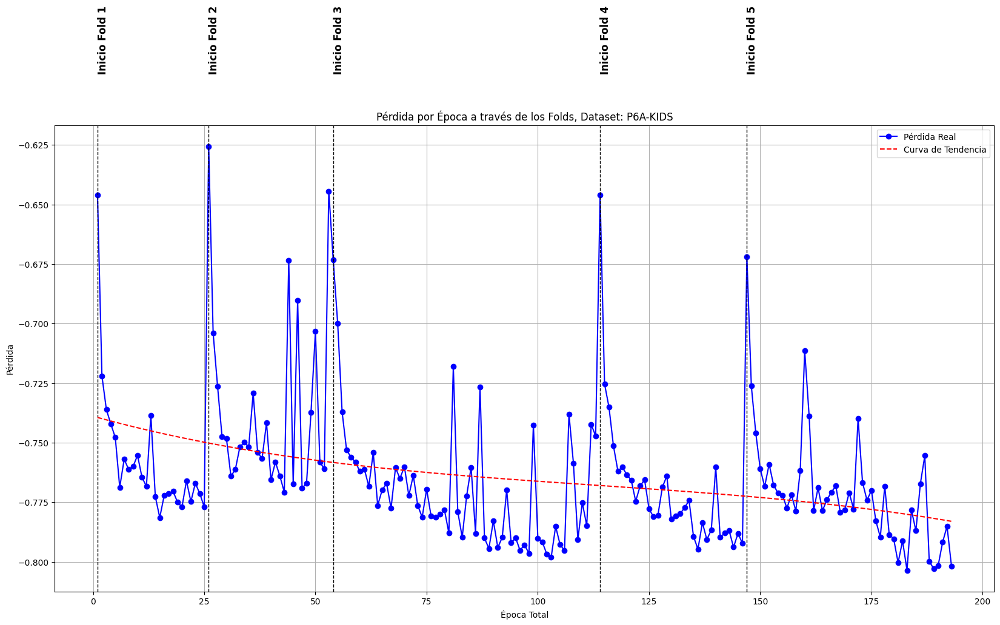

Mejor modelo guardado en models\modelo_tabnet_P6A-KIDS.pkl
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.718683738378731
Precision (Datos de Train): 0.6492574083198424
Recall (Datos de Train): 0.8280071813285458
F1 Score (Datos de Train): 0.7278178877184677
[[8401 4983]
 [1916 9224]]


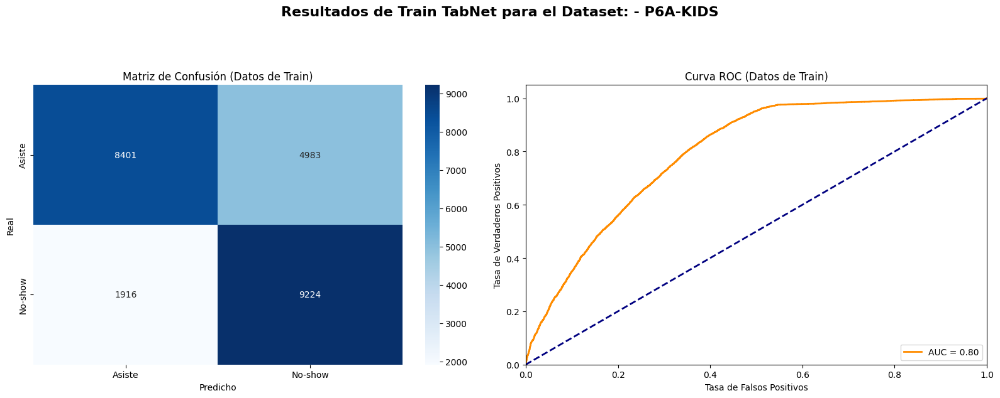

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6969336819586404
Precision (Datos de Test): 0.35086455331412103
Recall (Datos de Test): 0.5656213704994193
F1 Score (Datos de Test): 0.4330813694975545
[[2445  901]
 [ 374  487]]


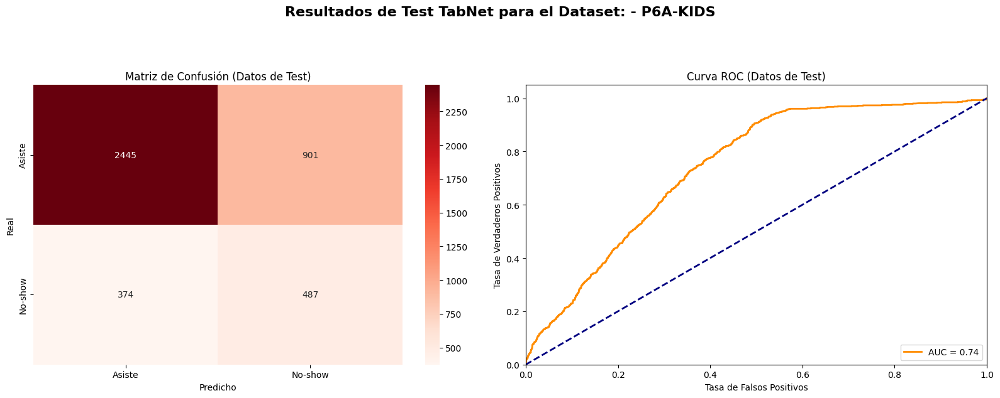


Ejecutando modelo para el dataset: P6B-ADOLESCENTS

Mejores hiperparámetros: {'C': 1, 'max_iter': 100, 'solver': 'lbfgs'}
Mejor puntaje de validación: 0.6661631419939577
Modelo guardado en models\modelo_logistic_regression_P6B-ADOLESCENTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6592111228653469
Precision (Datos de Train): 0.6480369515011547
Recall (Datos de Train): 0.4844613259668508
F1 Score (Datos de Train): 0.5544358822367121
[[2959  762]
 [1493 1403]]


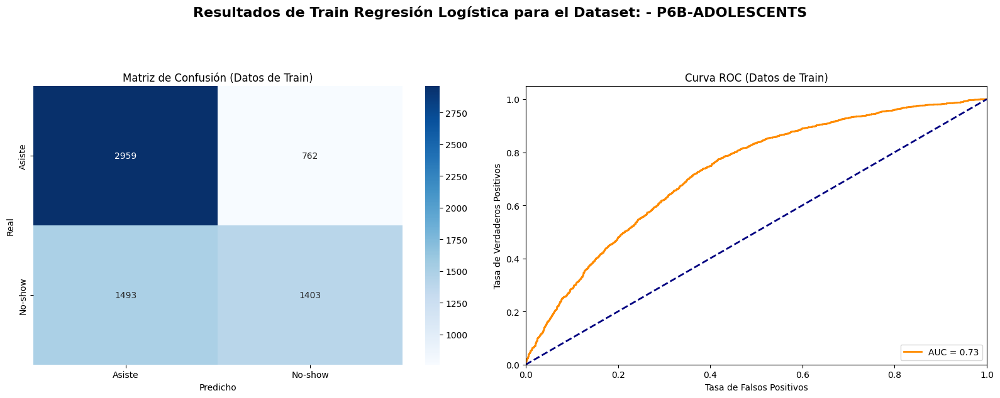

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6782334384858044
Precision (Datos de Test): 0.41950113378684806
Recall (Datos de Test): 0.5489614243323442
F1 Score (Datos de Test): 0.4755784061696658
[[675 256]
 [152 185]]


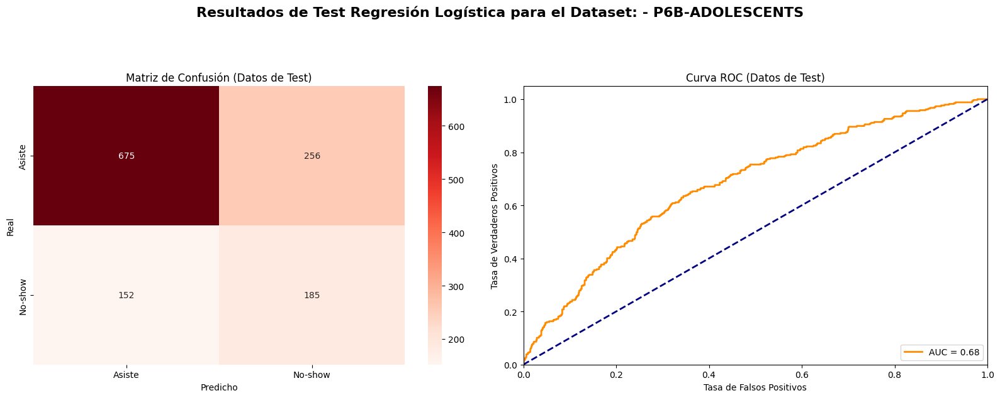

Mejores hiperparámetros: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 2}
Mejor puntaje de validación: 0.8087679516250945
Modelo guardado en models\modelo_decision_tree_P6B-ADOLESCENTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.914613873356506
Precision (Datos de Train): 0.9166964604933858
Recall (Datos de Train): 0.8853591160220995
F1 Score (Datos de Train): 0.9007553135429475
[[3488  233]
 [ 332 2564]]


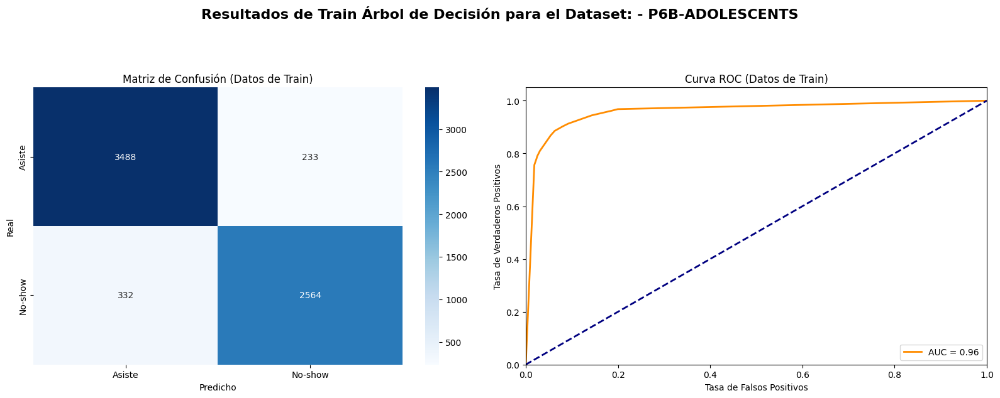

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7003154574132492
Precision (Datos de Test): 0.41568627450980394
Recall (Datos de Test): 0.314540059347181
F1 Score (Datos de Test): 0.3581081081081081
[[782 149]
 [231 106]]


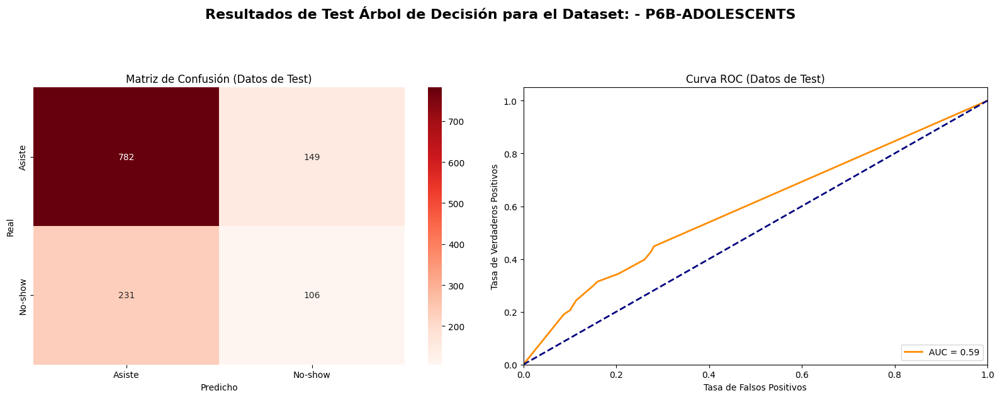

Comenzando el fold 1
Fold 1, Epoch 1, Train Loss: 0.7609, Val Loss: 0.7135
Fold 1, Epoch 2, Train Loss: 0.7265, Val Loss: 0.6864
Fold 1, Epoch 3, Train Loss: 0.7049, Val Loss: 0.6732
Fold 1, Epoch 4, Train Loss: 0.6813, Val Loss: 0.6576
Fold 1, Epoch 5, Train Loss: 0.6689, Val Loss: 0.6486
Fold 1, Epoch 6, Train Loss: 0.6631, Val Loss: 0.6434
Fold 1, Epoch 7, Train Loss: 0.6547, Val Loss: 0.6376
Fold 1, Epoch 8, Train Loss: 0.6490, Val Loss: 0.6334
Fold 1, Epoch 9, Train Loss: 0.6410, Val Loss: 0.6286
Fold 1, Epoch 10, Train Loss: 0.6367, Val Loss: 0.6271
Fold 1, Epoch 11, Train Loss: 0.6318, Val Loss: 0.6223
Fold 1, Epoch 12, Train Loss: 0.6244, Val Loss: 0.6202
Fold 1, Epoch 13, Train Loss: 0.6245, Val Loss: 0.6176
Fold 1, Epoch 14, Train Loss: 0.6224, Val Loss: 0.6158
Fold 1, Epoch 15, Train Loss: 0.6169, Val Loss: 0.6141
Fold 1, Epoch 16, Train Loss: 0.6177, Val Loss: 0.6129
Fold 1, Epoch 17, Train Loss: 0.6138, Val Loss: 0.6098
Fold 1, Epoch 18, Train Loss: 0.6127, Val Loss: 0.609

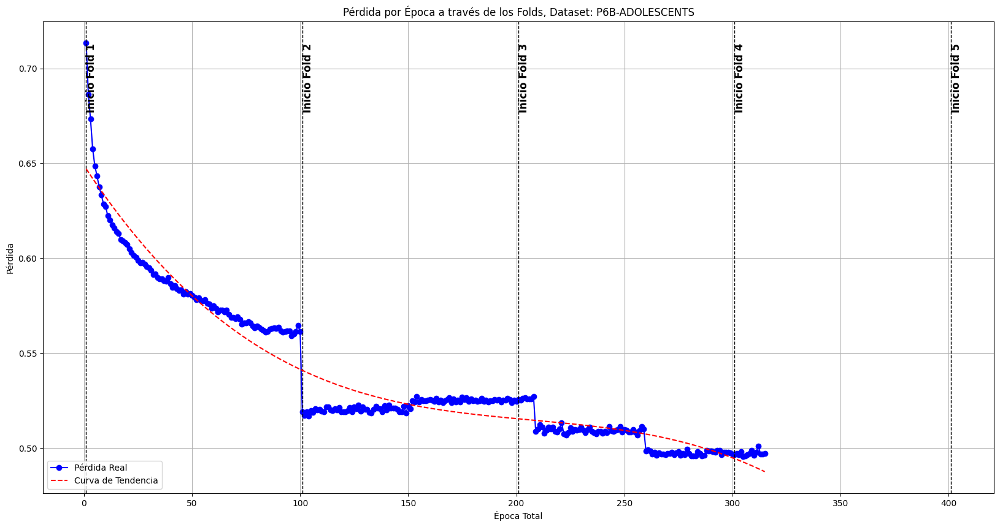

..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7320538008160798
Precision (Datos de Train): 0.6827204685974617
Recall (Datos de Train): 0.7244475138121547
F1 Score (Datos de Train): 0.7029653208242587
[[2746  975]
 [ 798 2098]]


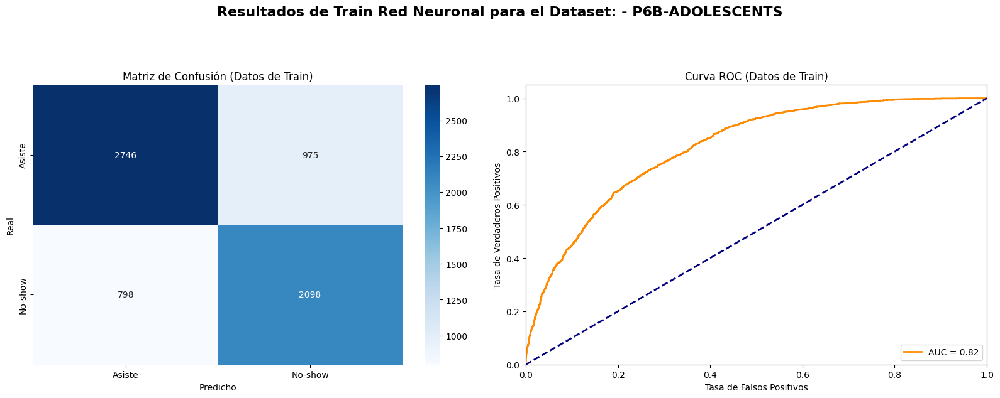

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6482649842271293
Precision (Datos de Test): 0.37915742793791574
Recall (Datos de Test): 0.5074183976261127
F1 Score (Datos de Test): 0.434010152284264
[[651 280]
 [166 171]]


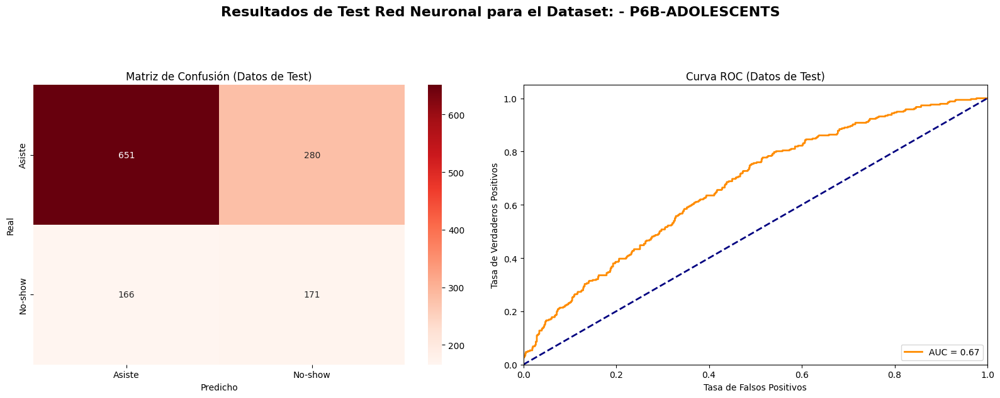

Comenzando el fold 1
epoch 0  | loss: 1.4463  | valid_auc: 0.60104 |  0:00:00s
epoch 1  | loss: 0.93019 | valid_auc: 0.58147 |  0:00:01s
epoch 2  | loss: 0.80603 | valid_auc: 0.61552 |  0:00:01s
epoch 3  | loss: 0.8714  | valid_auc: 0.63366 |  0:00:01s
epoch 4  | loss: 0.82145 | valid_auc: 0.66817 |  0:00:02s
epoch 5  | loss: 0.72601 | valid_auc: 0.6523  |  0:00:02s
epoch 6  | loss: 0.669   | valid_auc: 0.68937 |  0:00:02s
epoch 7  | loss: 0.66394 | valid_auc: 0.67853 |  0:00:03s
epoch 8  | loss: 0.64959 | valid_auc: 0.69554 |  0:00:03s
epoch 9  | loss: 0.62703 | valid_auc: 0.70792 |  0:00:04s
epoch 10 | loss: 0.61089 | valid_auc: 0.71892 |  0:00:04s
epoch 11 | loss: 0.59638 | valid_auc: 0.71844 |  0:00:04s
epoch 12 | loss: 0.59471 | valid_auc: 0.72124 |  0:00:05s
epoch 13 | loss: 0.58937 | valid_auc: 0.71541 |  0:00:05s
epoch 14 | loss: 0.58501 | valid_auc: 0.72723 |  0:00:05s
epoch 15 | loss: 0.57733 | valid_auc: 0.73576 |  0:00:06s
epoch 16 | loss: 0.56818 | valid_auc: 0.72773 |  0:

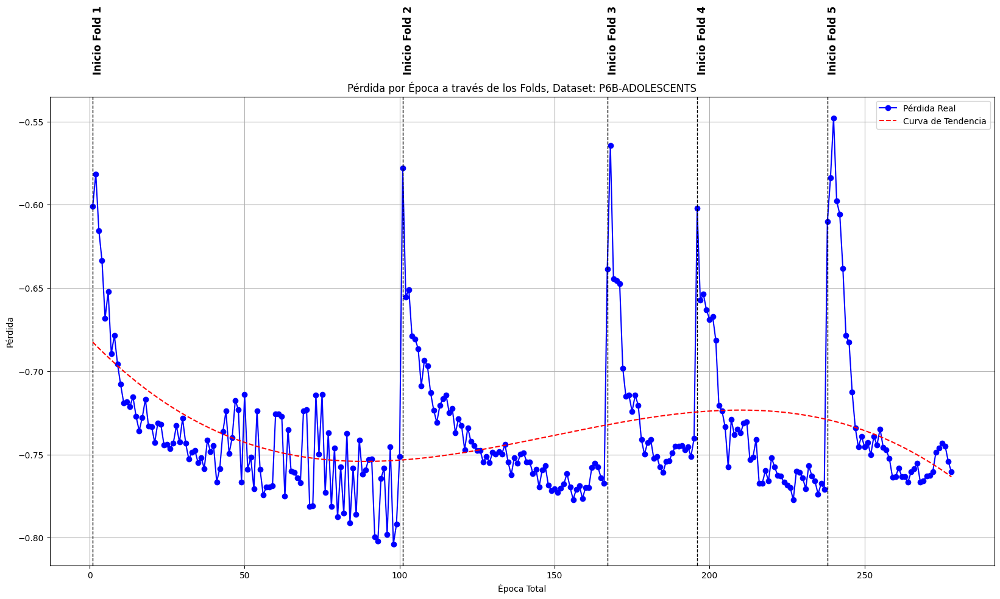

Mejor modelo guardado en models\modelo_tabnet_P6B-ADOLESCENTS.pkl
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.755629439322956
Precision (Datos de Train): 0.6763165150261925
Recall (Datos de Train): 0.8470303867403315
F1 Score (Datos de Train): 0.7521079258010118
[[2547 1174]
 [ 443 2453]]


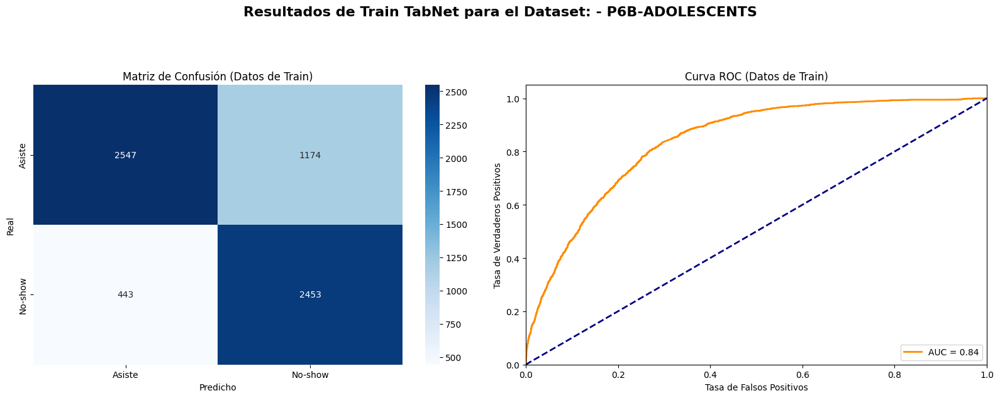

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6269716088328076
Precision (Datos de Test): 0.364
Recall (Datos de Test): 0.5400593471810089
F1 Score (Datos de Test): 0.4348864994026284
[[613 318]
 [155 182]]


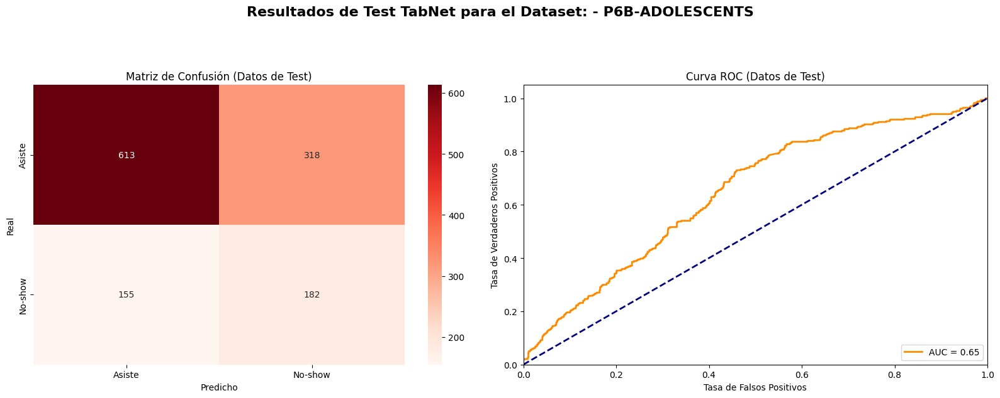


Ejecutando modelo para el dataset: P6C-YOUNGADULTS

Mejores hiperparámetros: {'C': 0.1, 'max_iter': 100, 'solver': 'lbfgs'}
Mejor puntaje de validación: 0.6455114822546972
Modelo guardado en models\modelo_logistic_regression_P6C-YOUNGADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6411990647962592
Precision (Datos de Train): 0.6314637482900137
Recall (Datos de Train): 0.4389501711677444
F1 Score (Datos de Train): 0.5178952092449232
[[5371 1347]
 [2950 2308]]


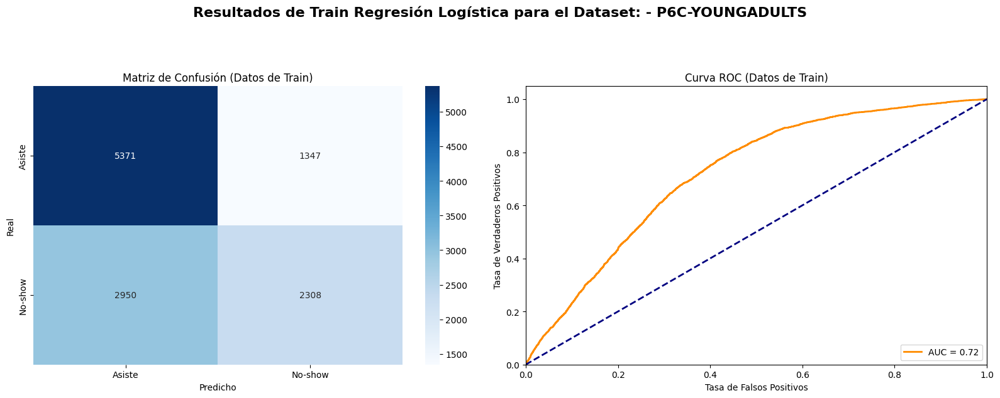

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6959429335711101
Precision (Datos de Test): 0.41389290882778584
Recall (Datos de Test): 0.5079928952042628
F1 Score (Datos de Test): 0.45614035087719296
[[1275  405]
 [ 277  286]]


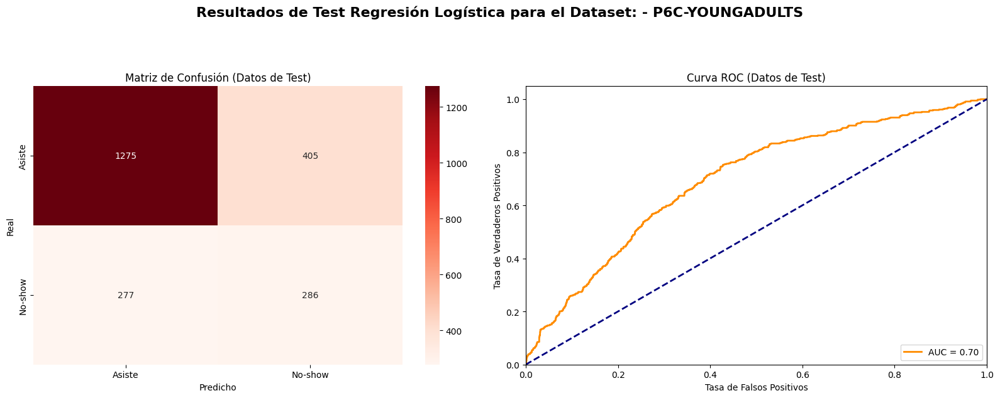

Mejores hiperparámetros: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 5}
Mejor puntaje de validación: 0.8080133555926544
Modelo guardado en models\modelo_decision_tree_P6C-YOUNGADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8812625250501002
Precision (Datos de Train): 0.8906313645621181
Recall (Datos de Train): 0.8316850513503233
F1 Score (Datos de Train): 0.8601494885916601
[[6181  537]
 [ 885 4373]]


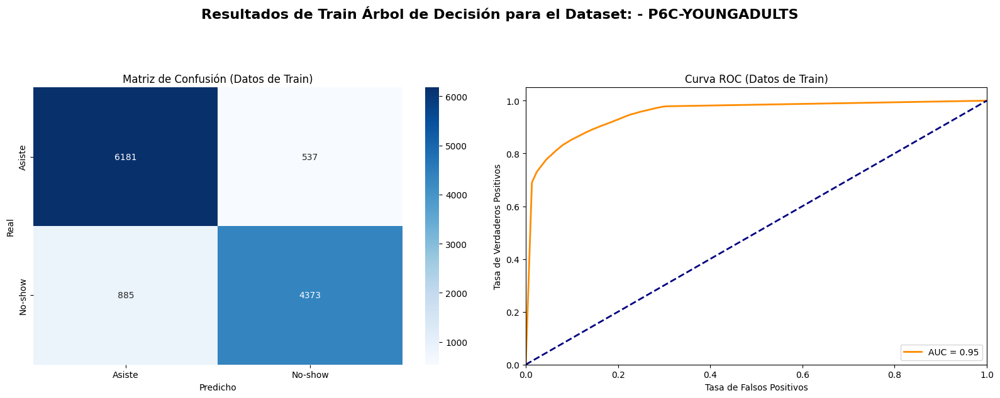

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6843513152028533
Precision (Datos de Test): 0.346072186836518
Recall (Datos de Test): 0.2895204262877442
F1 Score (Datos de Test): 0.3152804642166344
[[1372  308]
 [ 400  163]]


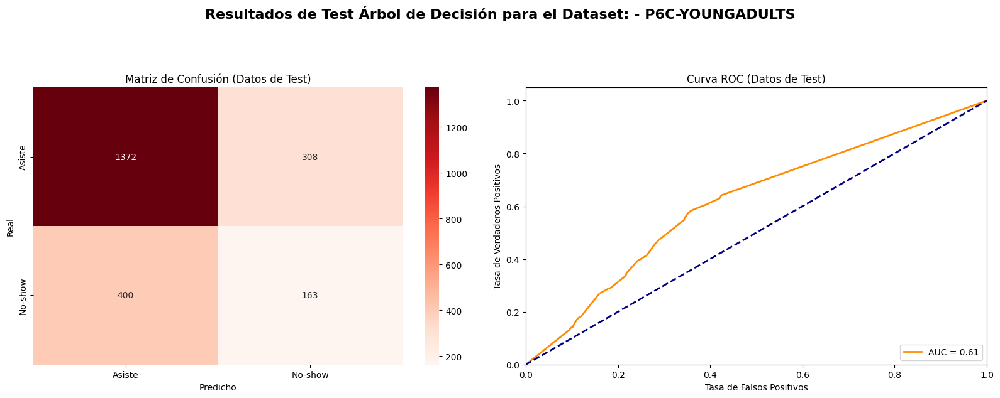

Comenzando el fold 1
Fold 1, Epoch 1, Train Loss: 0.7007, Val Loss: 0.6617
Fold 1, Epoch 2, Train Loss: 0.6723, Val Loss: 0.6505
Fold 1, Epoch 3, Train Loss: 0.6610, Val Loss: 0.6419
Fold 1, Epoch 4, Train Loss: 0.6489, Val Loss: 0.6358
Fold 1, Epoch 5, Train Loss: 0.6441, Val Loss: 0.6289
Fold 1, Epoch 6, Train Loss: 0.6361, Val Loss: 0.6248
Fold 1, Epoch 7, Train Loss: 0.6294, Val Loss: 0.6202
Fold 1, Epoch 8, Train Loss: 0.6262, Val Loss: 0.6170
Fold 1, Epoch 9, Train Loss: 0.6203, Val Loss: 0.6132
Fold 1, Epoch 10, Train Loss: 0.6166, Val Loss: 0.6096
Fold 1, Epoch 11, Train Loss: 0.6130, Val Loss: 0.6069
Fold 1, Epoch 12, Train Loss: 0.6065, Val Loss: 0.6043
Fold 1, Epoch 13, Train Loss: 0.6031, Val Loss: 0.6006
Fold 1, Epoch 14, Train Loss: 0.5994, Val Loss: 0.5993
Fold 1, Epoch 15, Train Loss: 0.5959, Val Loss: 0.5969
Fold 1, Epoch 16, Train Loss: 0.5934, Val Loss: 0.5939
Fold 1, Epoch 17, Train Loss: 0.5911, Val Loss: 0.5920
Fold 1, Epoch 18, Train Loss: 0.5890, Val Loss: 0.589

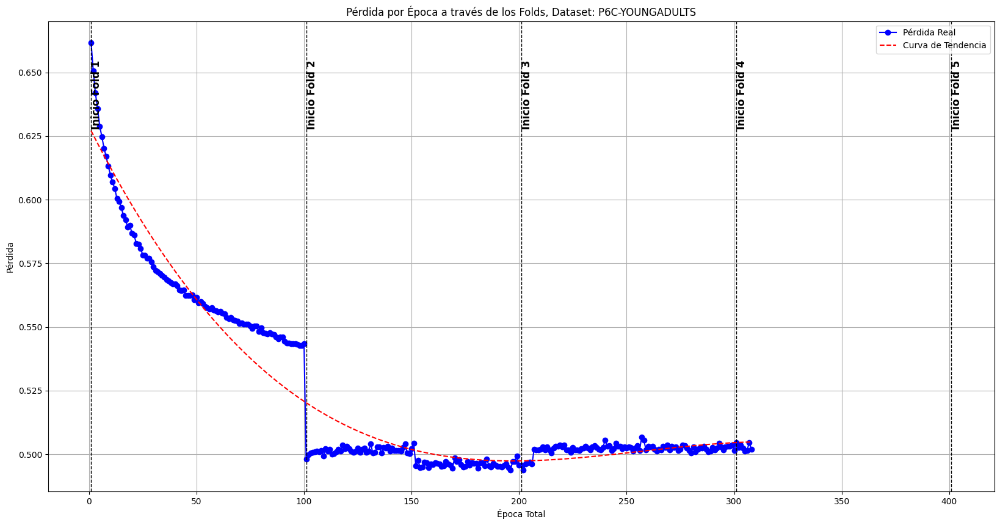

..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7365564462257849
Precision (Datos de Train): 0.6578117964880684
Recall (Datos de Train): 0.8335869151768733
F1 Score (Datos de Train): 0.7353409948829797
[[4438 2280]
 [ 875 4383]]


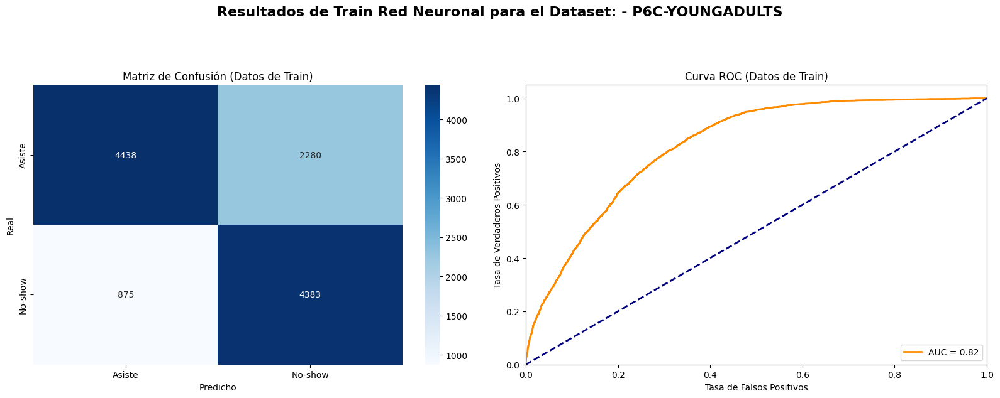

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6879179670084707
Precision (Datos de Test): 0.4002911208151383
Recall (Datos de Test): 0.48845470692717585
F1 Score (Datos de Test): 0.44
[[1268  412]
 [ 288  275]]


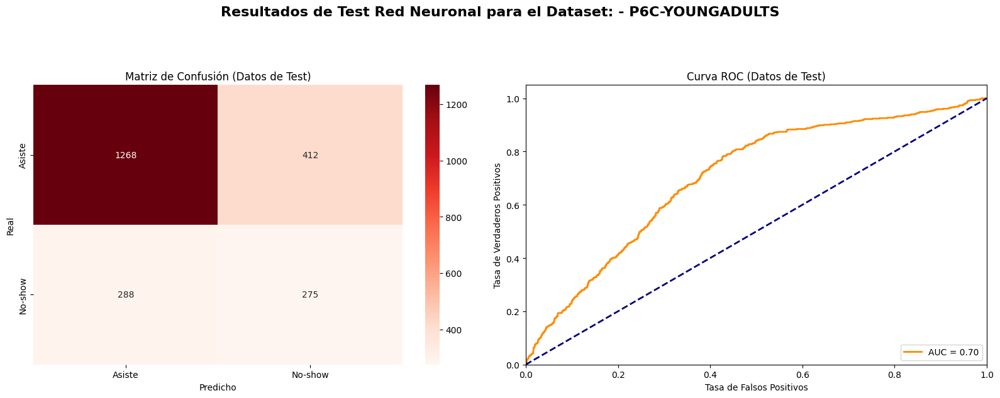

Comenzando el fold 1
epoch 0  | loss: 1.24388 | valid_auc: 0.62512 |  0:00:00s
epoch 1  | loss: 0.78134 | valid_auc: 0.69796 |  0:00:01s
epoch 2  | loss: 0.67914 | valid_auc: 0.69729 |  0:00:02s
epoch 3  | loss: 0.63639 | valid_auc: 0.69863 |  0:00:02s
epoch 4  | loss: 0.63317 | valid_auc: 0.72432 |  0:00:03s
epoch 5  | loss: 0.6074  | valid_auc: 0.72863 |  0:00:04s
epoch 6  | loss: 0.59315 | valid_auc: 0.72084 |  0:00:04s
epoch 7  | loss: 0.59091 | valid_auc: 0.73459 |  0:00:05s
epoch 8  | loss: 0.58166 | valid_auc: 0.73438 |  0:00:06s
epoch 9  | loss: 0.5788  | valid_auc: 0.72045 |  0:00:06s
epoch 10 | loss: 0.57536 | valid_auc: 0.73367 |  0:00:07s
epoch 11 | loss: 0.57177 | valid_auc: 0.72785 |  0:00:07s
epoch 12 | loss: 0.56522 | valid_auc: 0.74526 |  0:00:08s
epoch 13 | loss: 0.56692 | valid_auc: 0.73179 |  0:00:09s
epoch 14 | loss: 0.57008 | valid_auc: 0.73729 |  0:00:09s
epoch 15 | loss: 0.56007 | valid_auc: 0.74642 |  0:00:10s
epoch 16 | loss: 0.56135 | valid_auc: 0.74554 |  0:

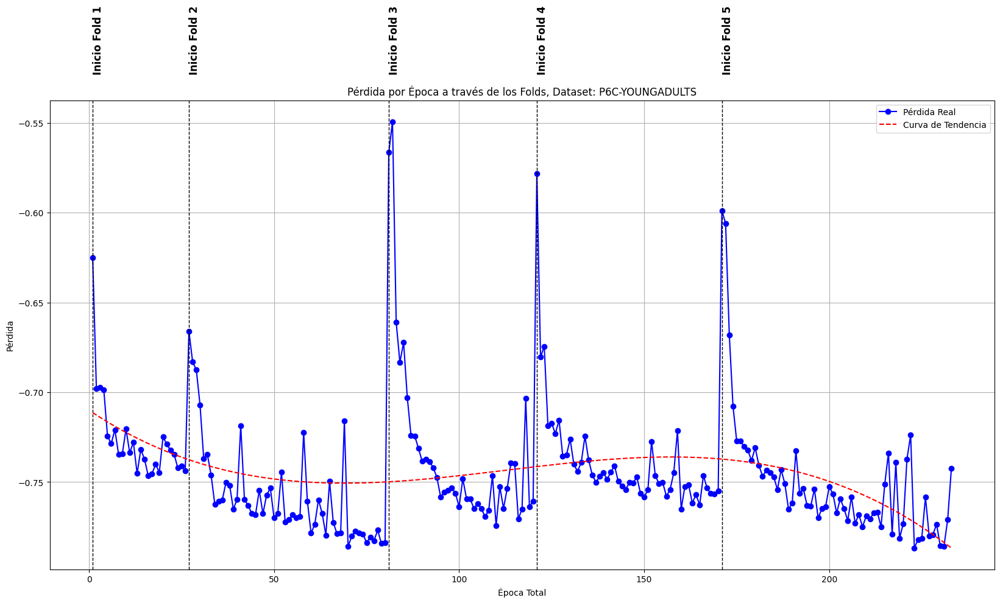

Mejor modelo guardado en models\modelo_tabnet_P6C-YOUNGADULTS.pkl
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7142618570474282
Precision (Datos de Train): 0.6366071428571428
Recall (Datos de Train): 0.8136173449980981
F1 Score (Datos de Train): 0.7143095675404909
[[4276 2442]
 [ 980 4278]]


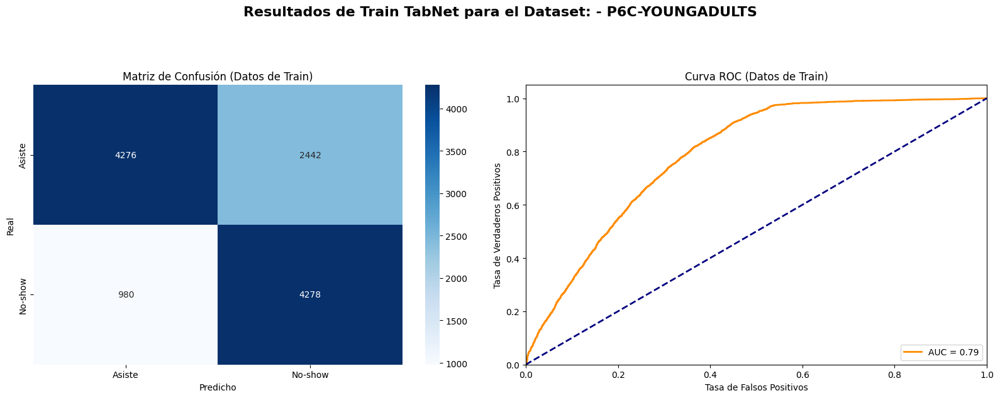

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6397681676326349
Precision (Datos de Test): 0.3788328387734916
Recall (Datos de Test): 0.6802841918294849
F1 Score (Datos de Test): 0.4866581956797967
[[1052  628]
 [ 180  383]]


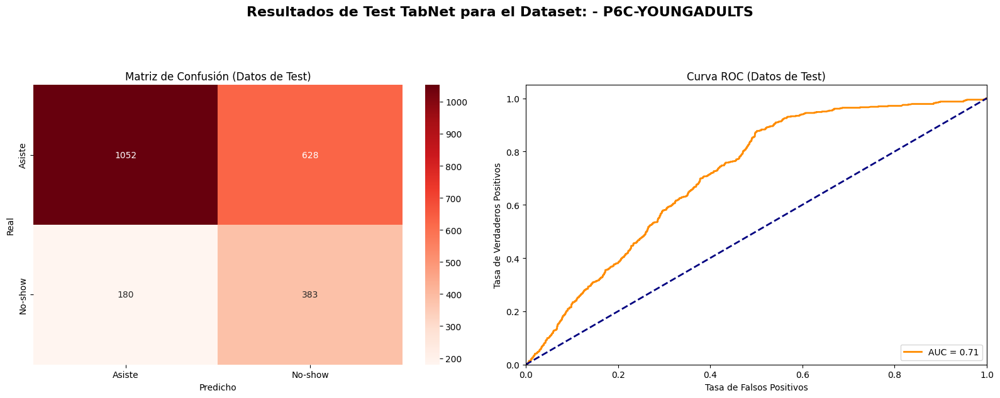


Ejecutando modelo para el dataset: P6D-ADULTS

Mejores hiperparámetros: {'C': 10, 'max_iter': 100, 'solver': 'newton-cg'}
Mejor puntaje de validación: 0.6394216583062851
Modelo guardado en models\modelo_logistic_regression_P6D-ADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6355562112717615
Precision (Datos de Train): 0.6394997251236944
Recall (Datos de Train): 0.453332034294622
F1 Score (Datos de Train): 0.5305587229190422
[[29119  7869]
 [16833 13959]]


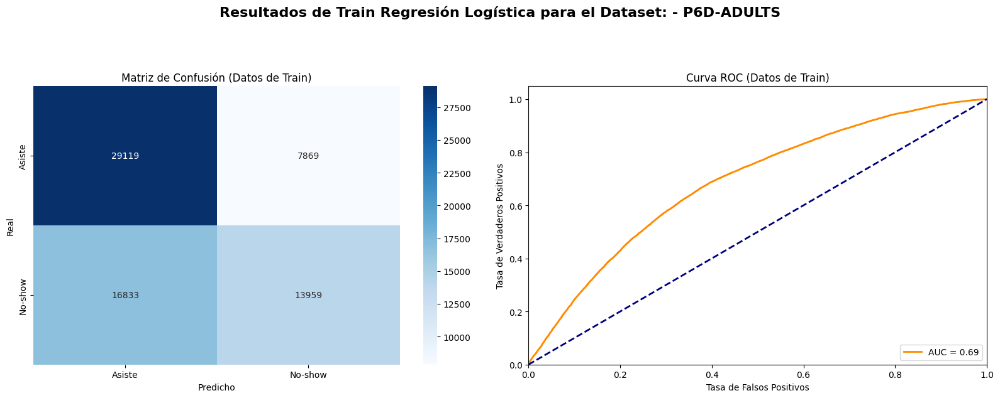

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6896251847986782
Precision (Datos de Test): 0.31074095347501435
Recall (Datos de Test): 0.4806752554420258
F1 Score (Datos de Test): 0.3774638060352346
[[6848 2400]
 [1169 1082]]


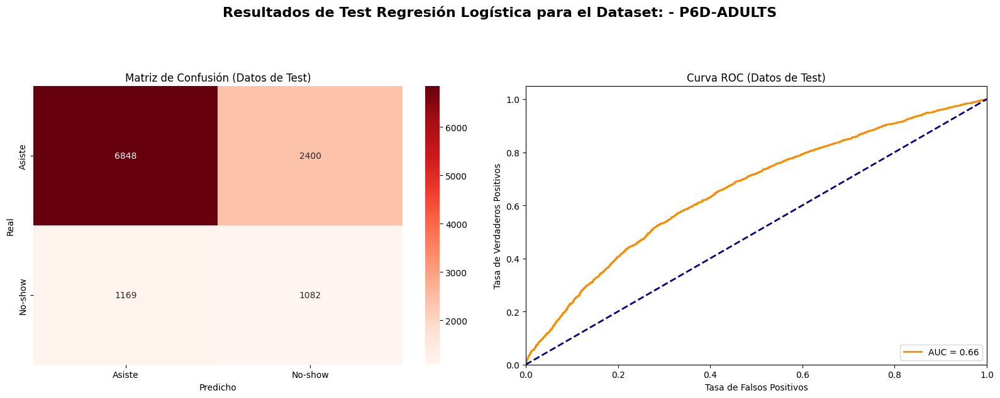

Mejores hiperparámetros: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
Mejor puntaje de validación: 0.803703157273532
Modelo guardado en models\modelo_decision_tree_P6D-ADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8597521392741222
Precision (Datos de Train): 0.836038140944683
Recall (Datos de Train): 0.8599311509482983
F1 Score (Datos de Train): 0.8478163422131147
[[31795  5193]
 [ 4313 26479]]


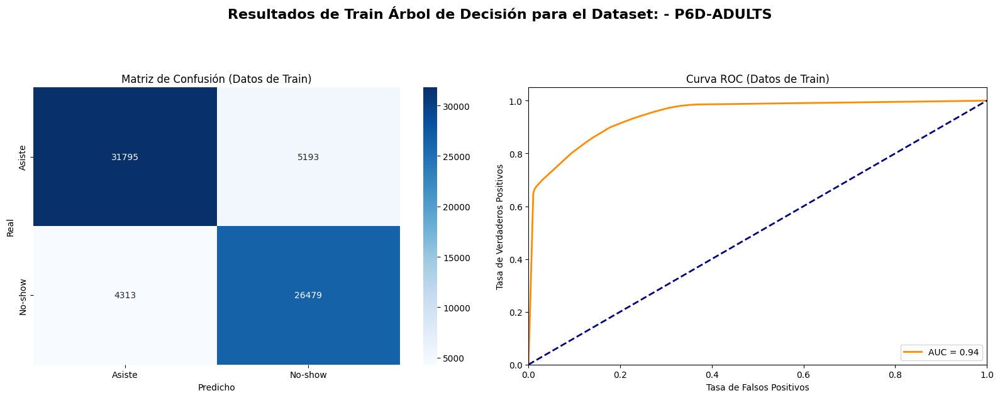

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7033655100443517
Precision (Datos de Test): 0.279467680608365
Recall (Datos de Test): 0.3265215459795646
F1 Score (Datos de Test): 0.3011677934849416
[[7353 1895]
 [1516  735]]


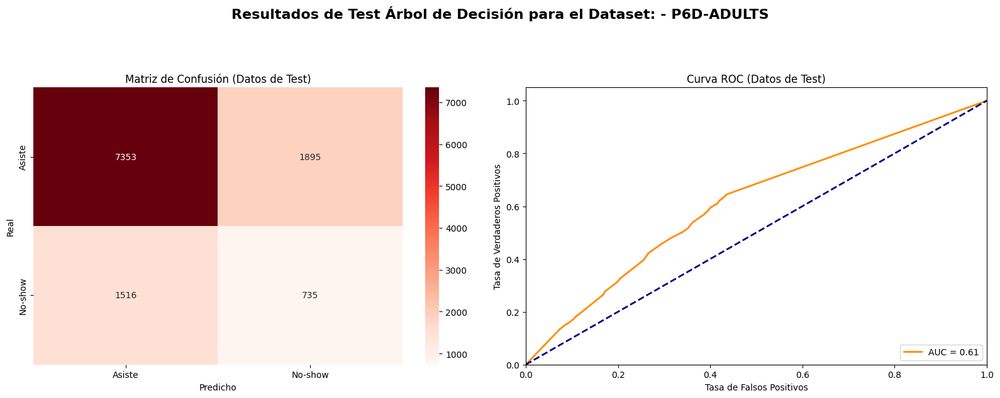

Comenzando el fold 1
Fold 1, Epoch 1, Train Loss: 0.6753, Val Loss: 0.6401
Fold 1, Epoch 2, Train Loss: 0.6450, Val Loss: 0.6211
Fold 1, Epoch 3, Train Loss: 0.6313, Val Loss: 0.6080
Fold 1, Epoch 4, Train Loss: 0.6200, Val Loss: 0.5965
Fold 1, Epoch 5, Train Loss: 0.6111, Val Loss: 0.5896
Fold 1, Epoch 6, Train Loss: 0.6051, Val Loss: 0.5834
Fold 1, Epoch 7, Train Loss: 0.5991, Val Loss: 0.5780
Fold 1, Epoch 8, Train Loss: 0.5954, Val Loss: 0.5748
Fold 1, Epoch 9, Train Loss: 0.5923, Val Loss: 0.5722
Fold 1, Epoch 10, Train Loss: 0.5908, Val Loss: 0.5690
Fold 1, Epoch 11, Train Loss: 0.5878, Val Loss: 0.5671
Fold 1, Epoch 12, Train Loss: 0.5848, Val Loss: 0.5656
Fold 1, Epoch 13, Train Loss: 0.5852, Val Loss: 0.5652
Fold 1, Epoch 14, Train Loss: 0.5817, Val Loss: 0.5614
Fold 1, Epoch 15, Train Loss: 0.5812, Val Loss: 0.5603
Fold 1, Epoch 16, Train Loss: 0.5788, Val Loss: 0.5617
Fold 1, Epoch 17, Train Loss: 0.5778, Val Loss: 0.5589
Fold 1, Epoch 18, Train Loss: 0.5758, Val Loss: 0.557

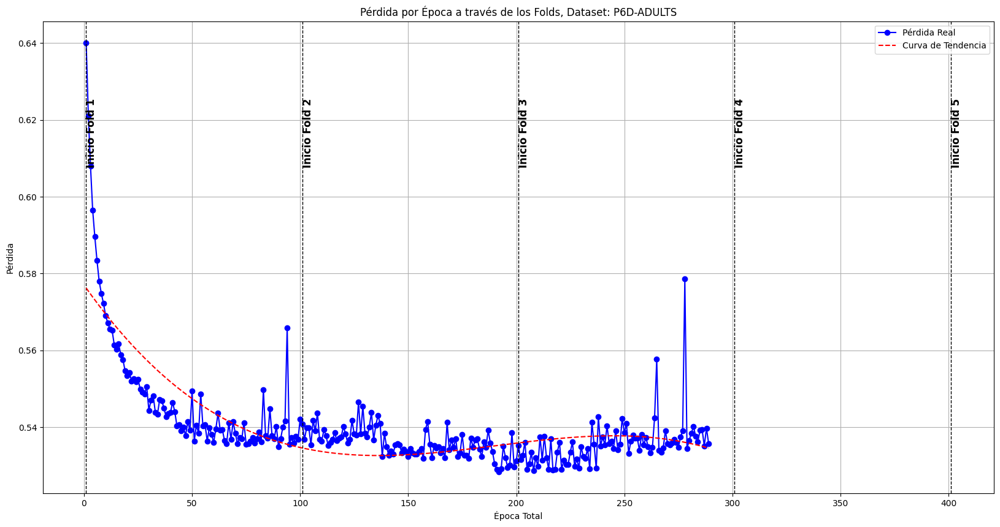

..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7174535261138979
Precision (Datos de Train): 0.6566461232069327
Recall (Datos de Train): 0.7923811379579111
F1 Score (Datos de Train): 0.7181562642570163
[[24230 12758]
 [ 6393 24399]]


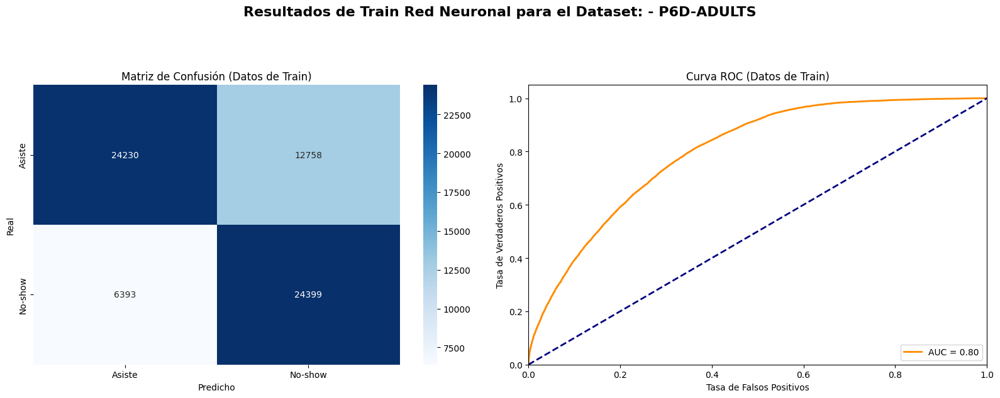

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6814505609183408
Precision (Datos de Test): 0.318974358974359
Recall (Datos de Test): 0.5526432696579298
F1 Score (Datos de Test): 0.4044870752723134
[[6592 2656]
 [1007 1244]]


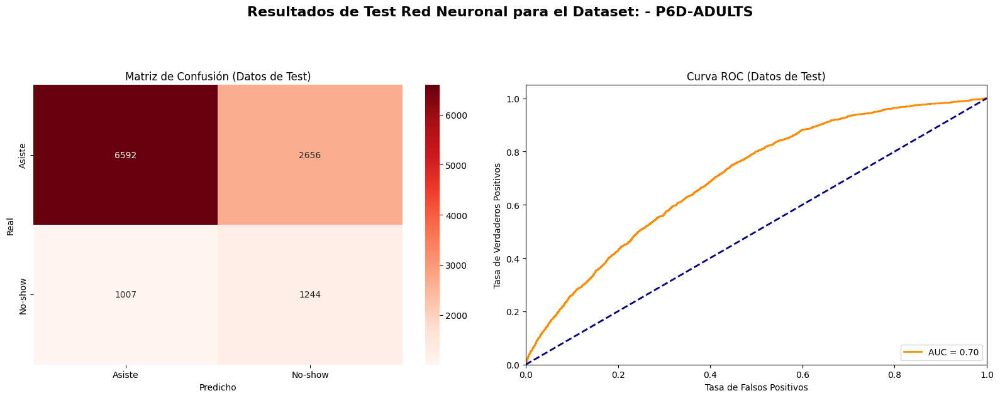

Comenzando el fold 1
epoch 0  | loss: 0.83971 | valid_auc: 0.61313 |  0:00:03s
epoch 1  | loss: 0.66661 | valid_auc: 0.69876 |  0:00:07s
epoch 2  | loss: 0.62239 | valid_auc: 0.72145 |  0:00:11s
epoch 3  | loss: 0.59736 | valid_auc: 0.73768 |  0:00:15s
epoch 4  | loss: 0.5758  | valid_auc: 0.71594 |  0:00:18s
epoch 5  | loss: 0.56831 | valid_auc: 0.75383 |  0:00:22s
epoch 6  | loss: 0.56493 | valid_auc: 0.73313 |  0:00:26s
epoch 7  | loss: 0.5635  | valid_auc: 0.74005 |  0:00:30s
epoch 8  | loss: 0.56355 | valid_auc: 0.75616 |  0:00:34s
epoch 9  | loss: 0.56266 | valid_auc: 0.70925 |  0:00:37s
epoch 10 | loss: 0.56305 | valid_auc: 0.75909 |  0:00:41s
epoch 11 | loss: 0.55841 | valid_auc: 0.71386 |  0:00:45s
epoch 12 | loss: 0.5574  | valid_auc: 0.75567 |  0:00:49s
epoch 13 | loss: 0.55846 | valid_auc: 0.71779 |  0:00:52s
epoch 14 | loss: 0.55813 | valid_auc: 0.76817 |  0:00:56s
epoch 15 | loss: 0.5503  | valid_auc: 0.75745 |  0:01:00s
epoch 16 | loss: 0.54787 | valid_auc: 0.77454 |  0:

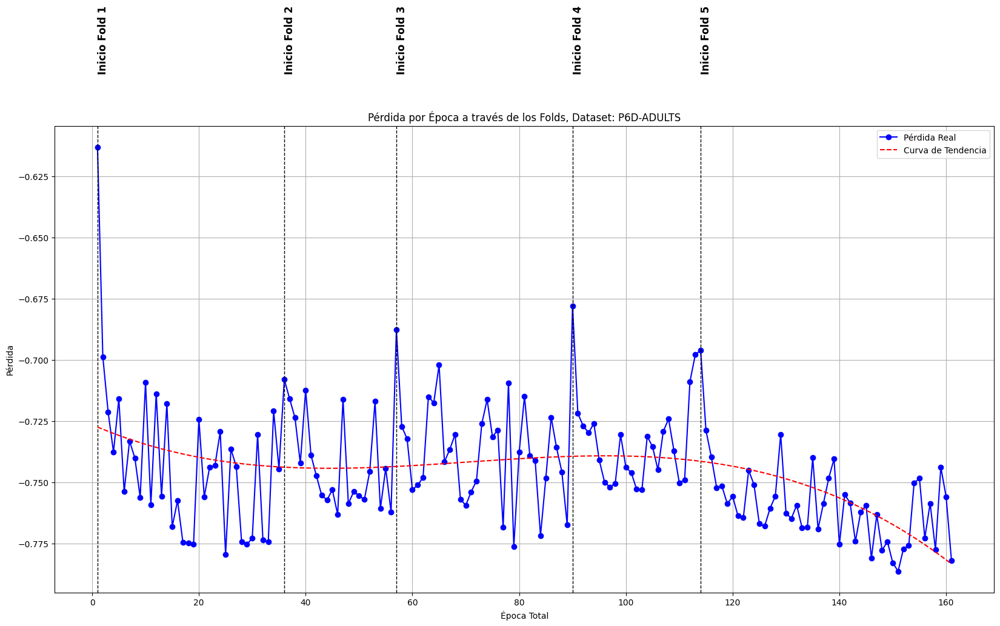

Mejor modelo guardado en models\modelo_tabnet_P6D-ADULTS.pkl
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.6981410445559162
Precision (Datos de Train): 0.6192575834526063
Recall (Datos de Train): 0.8711678358015069
F1 Score (Datos de Train): 0.7239238969099987
[[20495 16493]
 [ 3967 26825]]


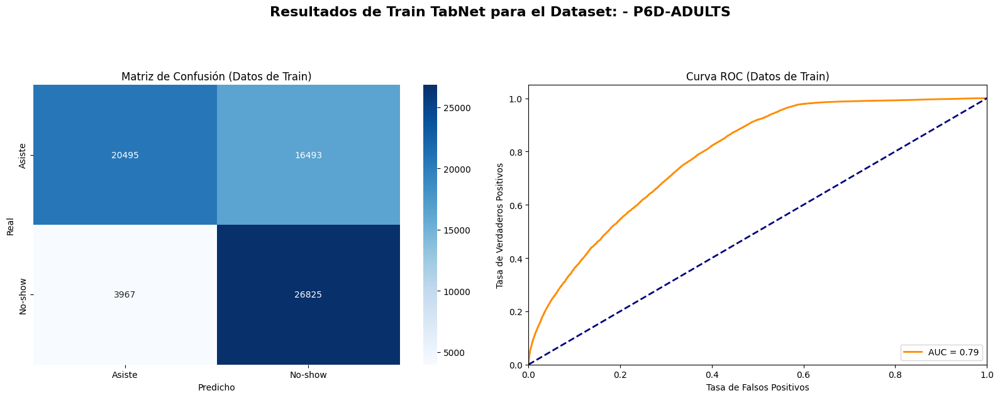

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.5925732672406296
Precision (Datos de Test): 0.2887886150642138
Recall (Datos de Test): 0.739227010217681
F1 Score (Datos de Test): 0.4153250967178335
[[5150 4098]
 [ 587 1664]]


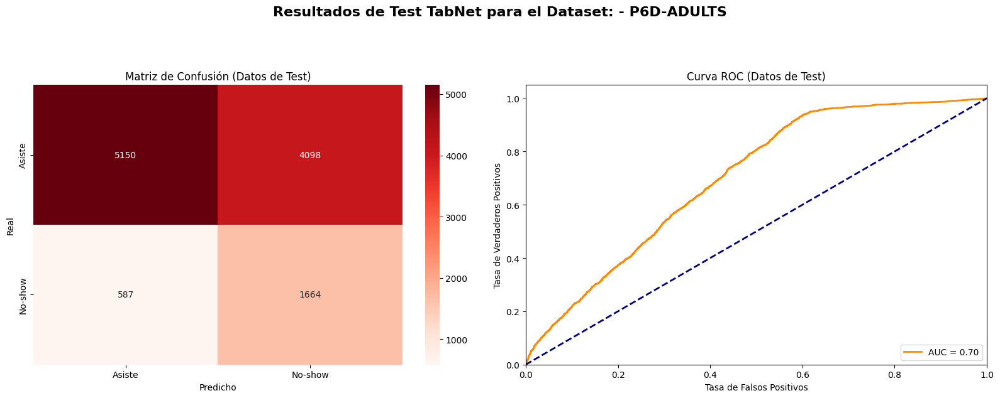


Ejecutando modelo para el dataset: P6E-OLDERADULTS

Mejores hiperparámetros: {'C': 1, 'max_iter': 100, 'solver': 'newton-cg'}
Mejor puntaje de validación: 0.5909460558416915
Modelo guardado en models\modelo_logistic_regression_P6E-OLDERADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.5894502873251654
Precision (Datos de Train): 0.6063988095238095
Recall (Datos de Train): 0.37398187449810716
F1 Score (Datos de Train): 0.46264102746044133
[[7613 2116]
 [5457 3260]]


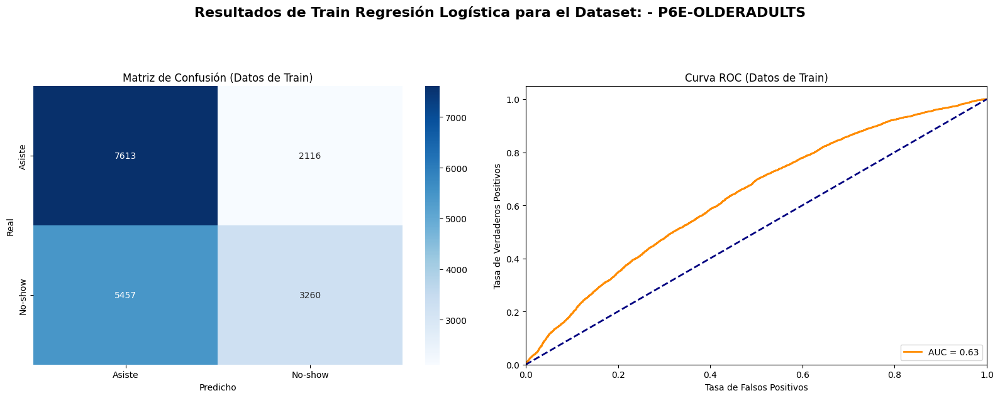

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6737317581653927
Precision (Datos de Test): 0.21303841676367868
Recall (Datos de Test): 0.4103139013452915
F1 Score (Datos de Test): 0.28045977011494255
[[1756  676]
 [ 263  183]]


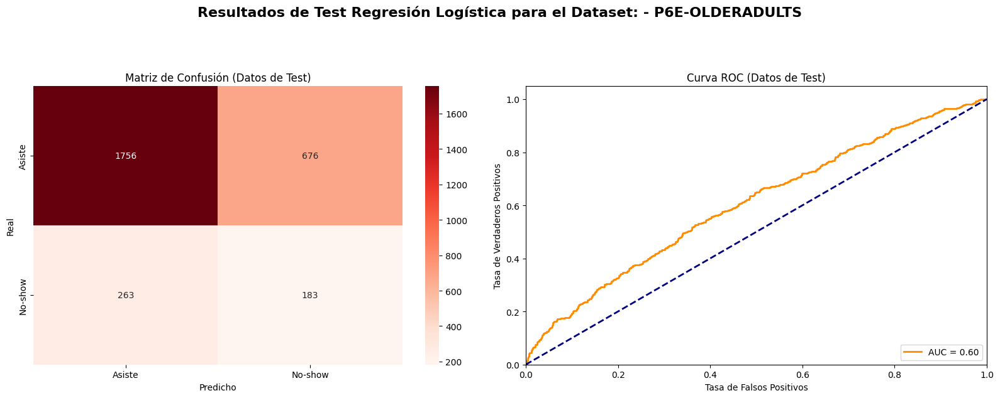

Mejores hiperparámetros: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 3}
Mejor puntaje de validación: 0.8168021680216803
Modelo guardado en models\modelo_decision_tree_P6E-OLDERADULTS.joblib
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.8800281903935813
Precision (Datos de Train): 0.8640026863666891
Recall (Datos de Train): 0.8855110703223587
F1 Score (Datos de Train): 0.8746246671576681
[[8514 1215]
 [ 998 7719]]


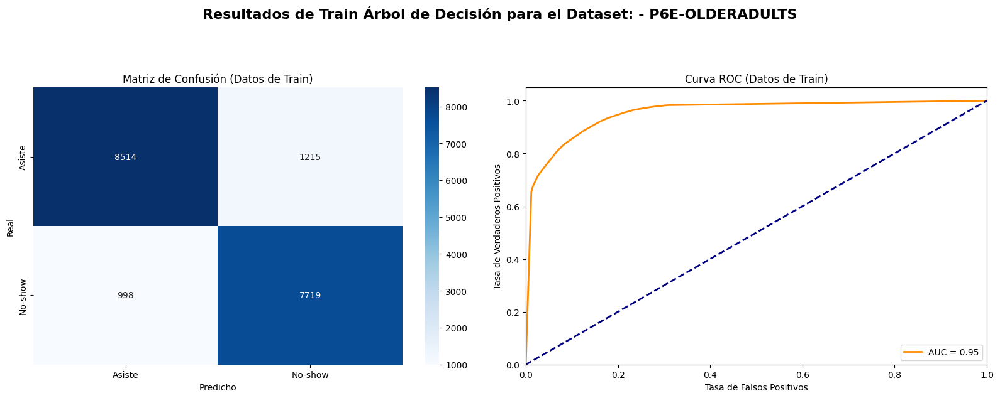

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.7244614315496872
Precision (Datos de Test): 0.19507908611599298
Recall (Datos de Test): 0.24887892376681614
F1 Score (Datos de Test): 0.2187192118226601
[[1974  458]
 [ 335  111]]


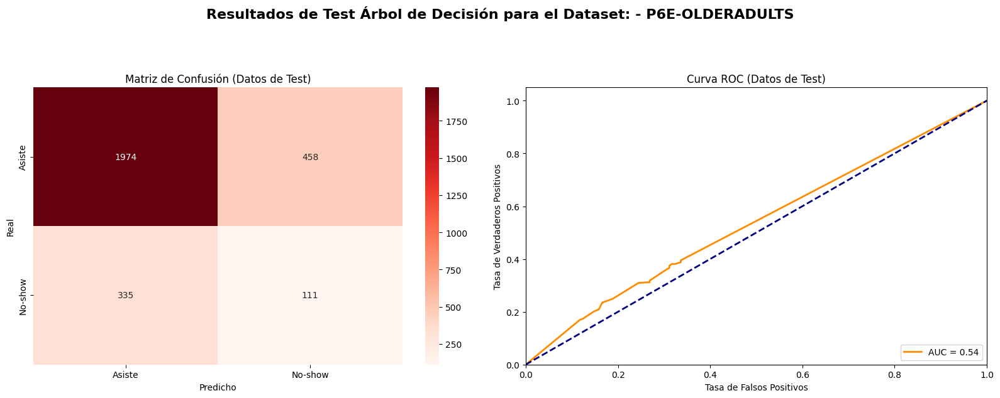

Comenzando el fold 1
Fold 1, Epoch 1, Train Loss: 0.7378, Val Loss: 0.6952
Fold 1, Epoch 2, Train Loss: 0.7086, Val Loss: 0.6797
Fold 1, Epoch 3, Train Loss: 0.6987, Val Loss: 0.6729
Fold 1, Epoch 4, Train Loss: 0.6882, Val Loss: 0.6686
Fold 1, Epoch 5, Train Loss: 0.6865, Val Loss: 0.6664
Fold 1, Epoch 6, Train Loss: 0.6782, Val Loss: 0.6634
Fold 1, Epoch 7, Train Loss: 0.6783, Val Loss: 0.6608
Fold 1, Epoch 8, Train Loss: 0.6707, Val Loss: 0.6584
Fold 1, Epoch 9, Train Loss: 0.6703, Val Loss: 0.6555
Fold 1, Epoch 10, Train Loss: 0.6683, Val Loss: 0.6528
Fold 1, Epoch 11, Train Loss: 0.6657, Val Loss: 0.6501
Fold 1, Epoch 12, Train Loss: 0.6640, Val Loss: 0.6487
Fold 1, Epoch 13, Train Loss: 0.6604, Val Loss: 0.6455
Fold 1, Epoch 14, Train Loss: 0.6552, Val Loss: 0.6419
Fold 1, Epoch 15, Train Loss: 0.6535, Val Loss: 0.6391
Fold 1, Epoch 16, Train Loss: 0.6492, Val Loss: 0.6352
Fold 1, Epoch 17, Train Loss: 0.6482, Val Loss: 0.6322
Fold 1, Epoch 18, Train Loss: 0.6438, Val Loss: 0.629

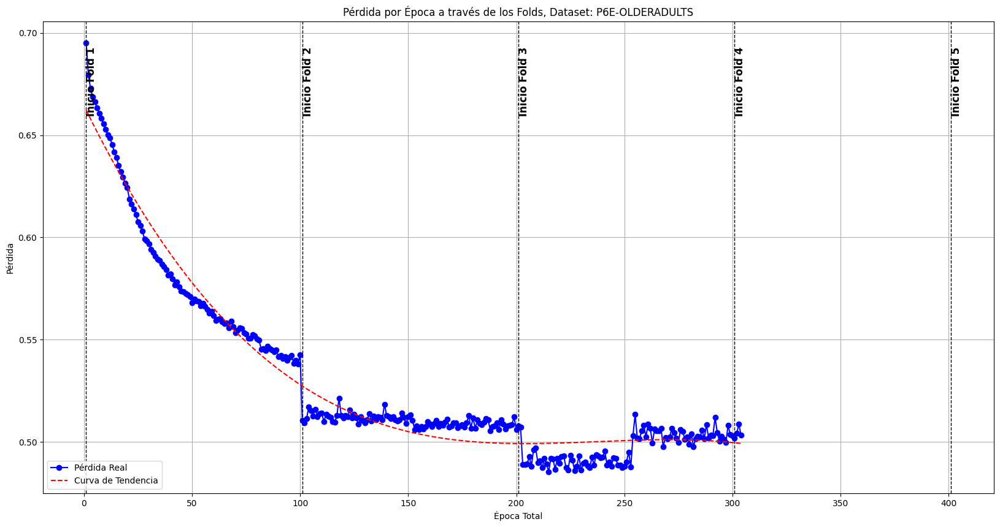

..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7562615201127616
Precision (Datos de Train): 0.7053614868152185
Recall (Datos de Train): 0.8315934381094413
F1 Score (Datos de Train): 0.7632936716857955
[[6701 3028]
 [1468 7249]]


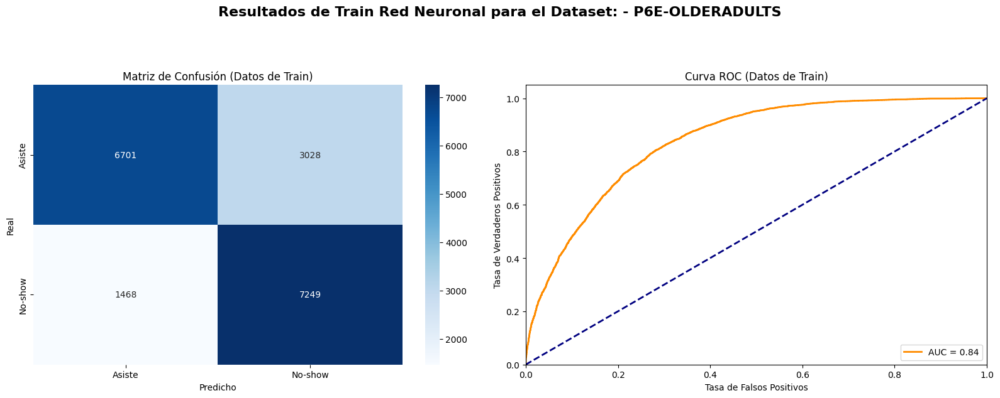

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6820708825573315
Precision (Datos de Test): 0.2184873949579832
Recall (Datos de Test): 0.4080717488789238
F1 Score (Datos de Test): 0.2845973416731822
[[1781  651]
 [ 264  182]]


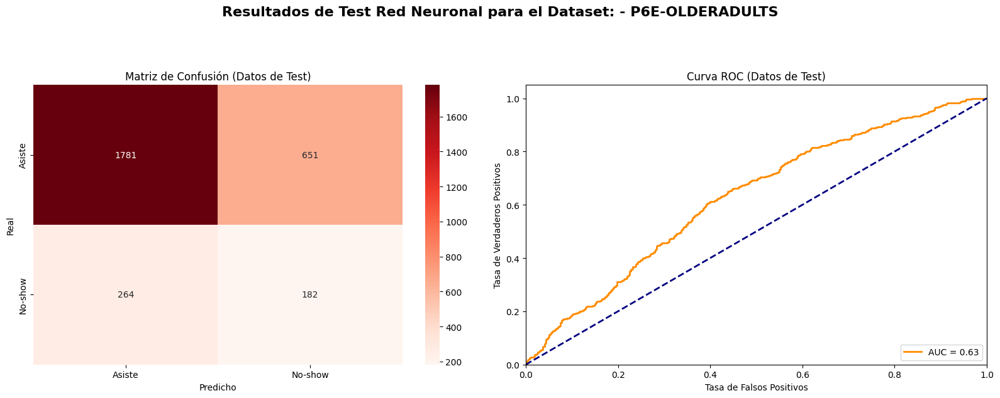

Comenzando el fold 1
epoch 0  | loss: 1.05905 | valid_auc: 0.59438 |  0:00:01s
epoch 1  | loss: 0.78492 | valid_auc: 0.63153 |  0:00:02s
epoch 2  | loss: 0.6876  | valid_auc: 0.67738 |  0:00:03s
epoch 3  | loss: 0.66555 | valid_auc: 0.64821 |  0:00:04s
epoch 4  | loss: 0.65435 | valid_auc: 0.68503 |  0:00:05s
epoch 5  | loss: 0.64059 | valid_auc: 0.68519 |  0:00:06s
epoch 6  | loss: 0.63026 | valid_auc: 0.69915 |  0:00:07s
epoch 7  | loss: 0.62395 | valid_auc: 0.69895 |  0:00:08s
epoch 8  | loss: 0.61816 | valid_auc: 0.69881 |  0:00:09s
epoch 9  | loss: 0.6171  | valid_auc: 0.70711 |  0:00:10s
epoch 10 | loss: 0.60805 | valid_auc: 0.71933 |  0:00:11s
epoch 11 | loss: 0.60067 | valid_auc: 0.71946 |  0:00:12s
epoch 12 | loss: 0.59638 | valid_auc: 0.71961 |  0:00:13s
epoch 13 | loss: 0.59708 | valid_auc: 0.71738 |  0:00:14s
epoch 14 | loss: 0.60193 | valid_auc: 0.72412 |  0:00:15s
epoch 15 | loss: 0.59692 | valid_auc: 0.72631 |  0:00:16s
epoch 16 | loss: 0.59395 | valid_auc: 0.72391 |  0:

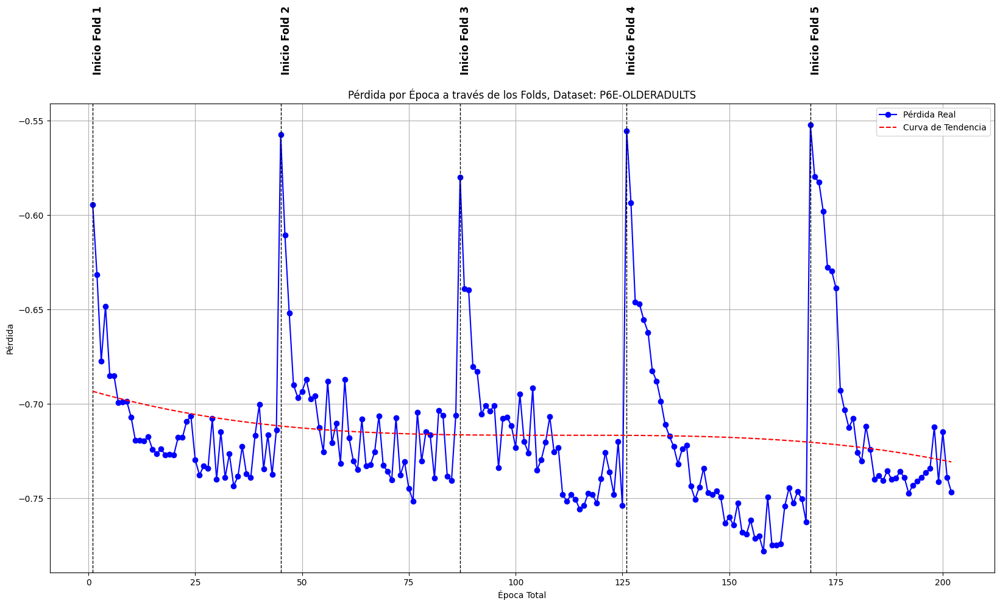

Mejor modelo guardado en models\modelo_tabnet_P6E-OLDERADULTS.pkl
..................................
Resultados datos de entrenamiento:
Accuracy (Datos de Train): 0.7000975821316274
Precision (Datos de Train): 0.6704849587838562
Recall (Datos de Train): 0.7184811288287255
F1 Score (Datos de Train): 0.6936537822571713
[[6651 3078]
 [2454 6263]]


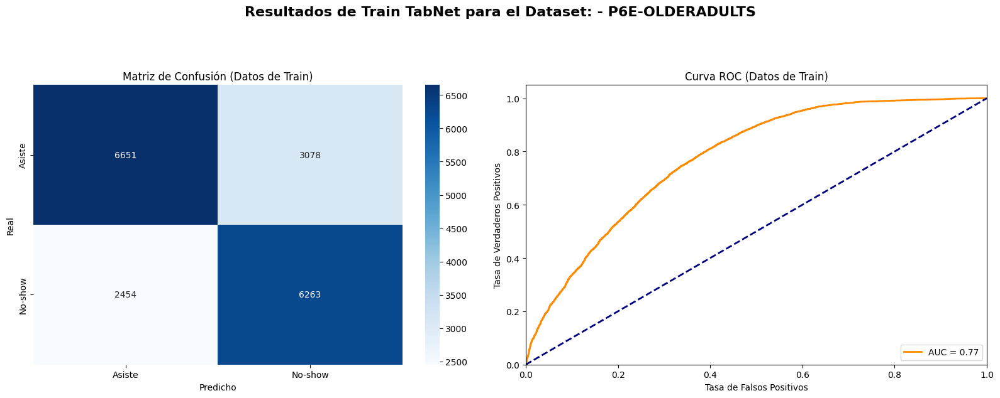

.........................
Resultados datos de test:
Accuracy (Datos de Test): 0.6782487838776928
Precision (Datos de Test): 0.22093023255813954
Recall (Datos de Test): 0.4260089686098655
F1 Score (Datos de Test): 0.29096477794793263
[[1762  670]
 [ 256  190]]


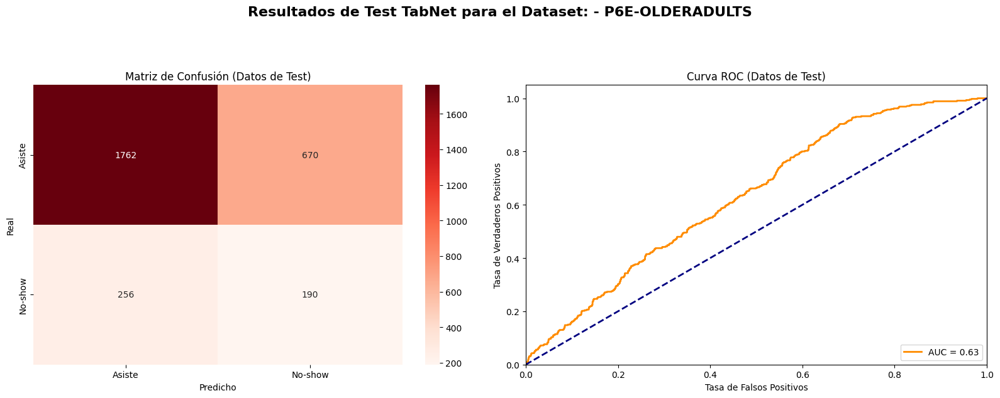

In [10]:
def load_data(file_path):
    return joblib.load(file_path)

# Listado de archivos
X_test_files = [
    "X_test_P1-ALL-ADASYN.pkl", "X_test_P1-ALL.pkl", "X_test_P2-NOCONDITIONS.pkl", 
    "X_test_P3-AGE.pkl", "X_test_P4-TIME.pkl", "X_test_P5-HEALTHCENTRE.pkl",
    "X_test_P6A-KIDS.pkl", "X_test_P6B-ADOLESCENTS.pkl", "X_test_P6C-YOUNGADULTS.pkl",
    "X_test_P6D-ADULTS.pkl", "X_test_P6E-OLDERADULTS.pkl"
]

X_train_files = [
    "X_train_P1-ALL-ADASYN.pkl", "X_train_P1-ALL.pkl", "X_train_P2-NOCONDITIONS.pkl", 
    "X_train_P3-AGE.pkl", "X_train_P4-TIME.pkl", "X_train_P5-HEALTHCENTRE.pkl",
    "X_train_P6A-KIDS.pkl", "X_train_P6B-ADOLESCENTS.pkl", "X_train_P6C-YOUNGADULTS.pkl",
    "X_train_P6D-ADULTS.pkl", "X_train_P6E-OLDERADULTS.pkl"
]

y_test_files = [
    "y_test_P1-ALL-ADASYN.pkl", "y_test_P1-ALL.pkl", "y_test_P2-NOCONDITIONS.pkl", 
    "y_test_P3-AGE.pkl", "y_test_P4-TIME.pkl", "y_test_P5-HEALTHCENTRE.pkl",
    "y_test_P6A-KIDS.pkl", "y_test_P6B-ADOLESCENTS.pkl", "y_test_P6C-YOUNGADULTS.pkl",
    "y_test_P6D-ADULTS.pkl", "y_test_P6E-OLDERADULTS.pkl"
]

y_train_files = [
    "y_train_P1-ALL-ADASYN.pkl", "y_train_P1-ALL.pkl", "y_train_P2-NOCONDITIONS.pkl", 
    "y_train_P3-AGE.pkl", "y_train_P4-TIME.pkl", "y_train_P5-HEALTHCENTRE.pkl",
    "y_train_P6A-KIDS.pkl", "y_train_P6B-ADOLESCENTS.pkl", "y_train_P6C-YOUNGADULTS.pkl",
    "y_train_P6D-ADULTS.pkl", "y_train_P6E-OLDERADULTS.pkl"
]

file_names = [
    "P1-ALL-ADASYN", "P1-ALL", "P2-NOCONDITIONS", 
    "P3-AGE", "P4-TIME", "P5-HEALTHCENTRE",
    "P6A-KIDS", "P6B-ADOLESCENTS", "P6C-YOUNGADULTS",
    "P6D-ADULTS", "P6E-OLDERADULTS"
]

# Se cargan los archivos en un diccionario
data = {}
for file_list in [X_test_files, X_train_files, y_test_files, y_train_files]:
    for file_name in file_list:
        data[file_name] = load_data(file_name)

# Se crea bucle para analizar los datos con el modelo de PyTorch
for idx, (X_train_file, y_train_file, X_test_file, y_test_file) in enumerate(zip(X_train_files, y_train_files, X_test_files, y_test_files)):
    try:
        if X_train_file in data and y_train_file in data and X_test_file in data and y_test_file in data:
            X_train = data[X_train_file]
            y_train = data[y_train_file]
            X_test = data[X_test_file]
            y_test = data[y_test_file]

            dataset_name = file_names[idx]
            titulo = f"\n{'='*40}\nEjecutando modelo para el dataset: {dataset_name}\n{'='*40}\n"
            print(titulo)
            # Se ejecuta el modelo de regresión logística
            execute_model_logistic_regression(X_train, y_train, X_test, y_test, dataset_name)
            # Se ejecuta el modelo de árbol de decisión
            execute_model_decision_tree(X_train, y_train, X_test, y_test, dataset_name)
            # Se ejecuta el modelo de PyTorch
            execute_model_pytorch(X_train, y_train, X_test, y_test, device='cuda', dataset_name=dataset_name)
            # Se ejecuta el modelo de TabNet
            execute_model_tabnet(X_train, y_train, X_test, y_test, device='cuda', dataset_name=dataset_name)
        else:
            print(f"Archivos correspondientes no encontrados para {X_train_file}. Omitiendo este archivo.")
    except KeyError as e:
        print(f"Error: {e} - La clave no existe en el diccionario 'data'. Omitiendo este archivo.")